In [1]:
import os, glob

import pickle
import numpy as np
import pandas as pd
import lightkurve as lk
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import patches
from tqdm.auto import tqdm
import seaborn as sns

import contaminante as ctm
from vetting import centroid_test

from astropy.io import fits
from astropy.table import Table
from astropy import units

path = os.path.dirname(os.getcwd())
sys.path.append(path)
from kepler_apertures import EXBAMachine

%matplotlib inline

Created TAP+ (v20200428.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v20200428.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


In [2]:
from vetting import version
version

<module 'vetting.version' from '/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/vetting/version.py'>

In [3]:
period, t0, duration = 4.996728053240843, 170.3553207773692, 0.09899999999999999

period       =  4.996676292653994 # d
duration     =  0.09100000000000001 # d
depth        =  0.0050820479726194434 
transit_time =  2455468.058002121 # jd

file_names = np.sort(glob.glob('../data/export/*/*/lc_*_Gaia_EDR3_2077240046296834304.fits.gz'))
file_names

array(['../data/export/11/17/lc_q11_ch17_Gaia_EDR3_2077240046296834304.fits.gz',
       '../data/export/12/57/lc_q12_ch57_Gaia_EDR3_2077240046296834304.fits.gz',
       '../data/export/15/17/lc_q15_ch17_Gaia_EDR3_2077240046296834304.fits.gz',
       '../data/export/16/57/lc_q16_ch57_Gaia_EDR3_2077240046296834304.fits.gz',
       '../data/export/7/17/lc_q7_ch17_Gaia_EDR3_2077240046296834304.fits.gz',
       '../data/export/8/57/lc_q8_ch57_Gaia_EDR3_2077240046296834304.fits.gz'],
      dtype='<U70')

# LC from EXBA

In [4]:
fits.open(file_names[0])[0].header

SIMPLE  =                    T / conforms to FITS standards                     
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T / file contains extensions                       
NEXTEND =                    2 / number of standard extensions                  
EXTNAME = 'PRIMARY '           / name of extension                              
EXTVER  =                    1 / extension version number (not format version)  
ORIGIN  = 'ApertureMACHINE'    / institution responsible for file               
DATE    = '2021-04-20'         / file creation date.                            
CREATOR = 'lightkurve.LightCurve.to_fits()' / pipeline job and program used t   
TELESCOP= 'Kepler  '           / telescope                                      
INSTRUME= 'Kepler Photometer'  / detector type                                  
OBJECT  = 'Gaia EDR3 2077240

0 14


Modeling TPFs: 100%|██████████| 1/1 [00:12<00:00, 12.22s/it]


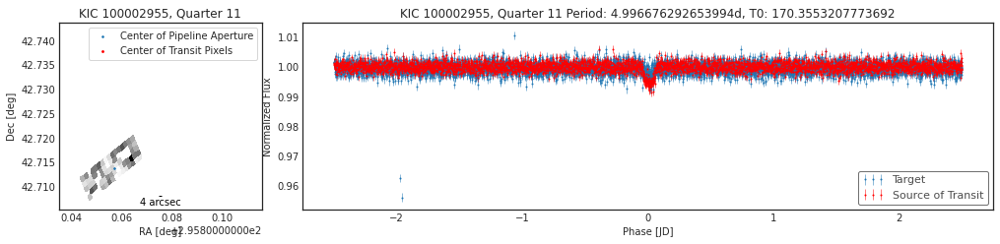

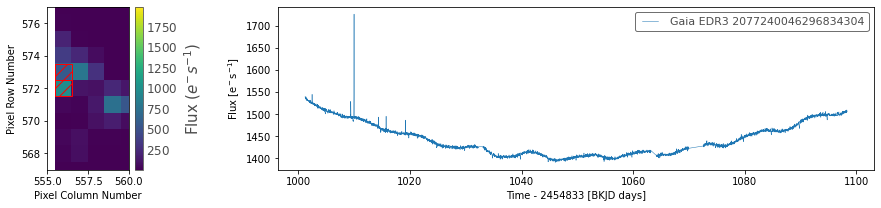

0 9


Modeling TPFs: 100%|██████████| 1/1 [00:09<00:00,  9.37s/it]


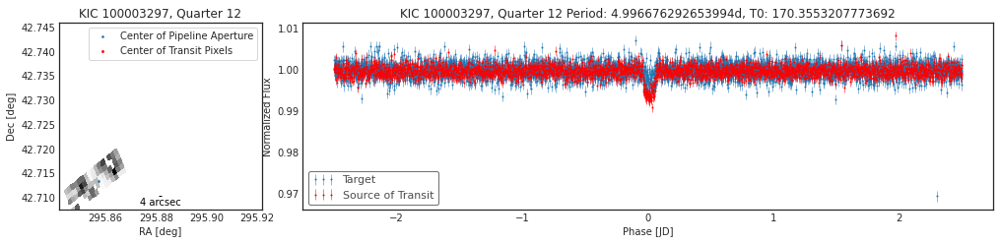

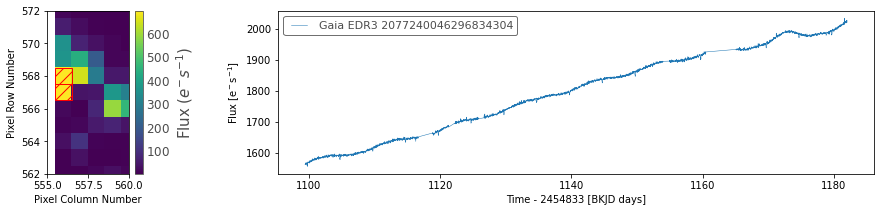

0 14


Modeling TPFs: 100%|██████████| 1/1 [00:10<00:00, 10.84s/it]


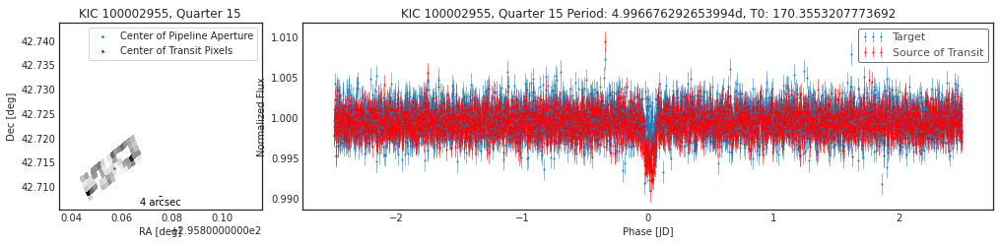

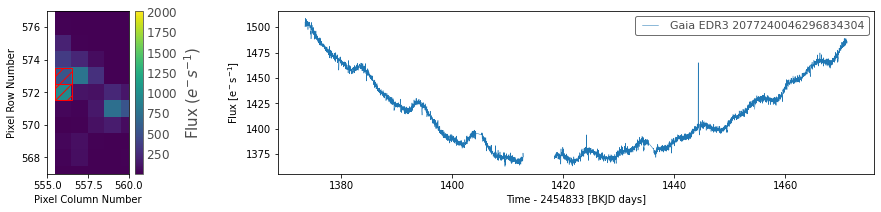

0 9


Modeling TPFs: 100%|██████████| 1/1 [00:09<00:00,  9.11s/it]


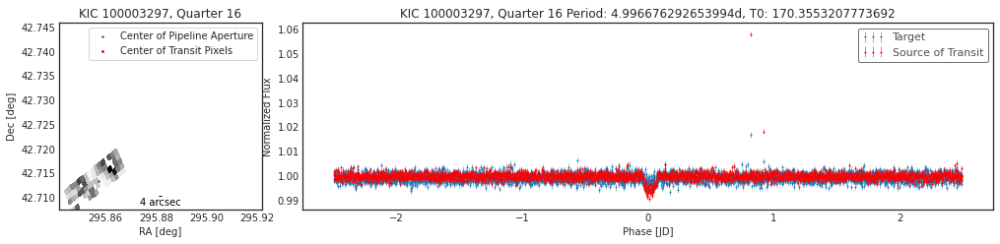

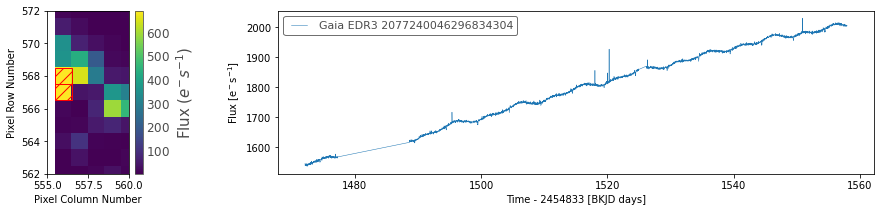

0 14


Modeling TPFs: 100%|██████████| 1/1 [00:11<00:00, 11.94s/it]


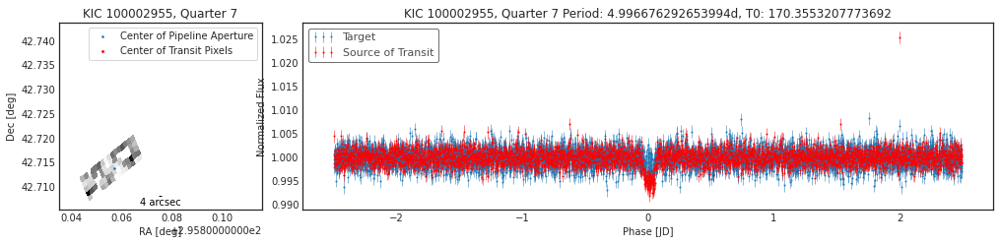

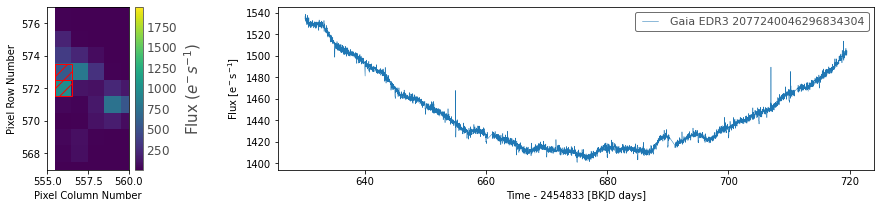

0 9


Modeling TPFs: 100%|██████████| 1/1 [00:07<00:00,  7.33s/it]


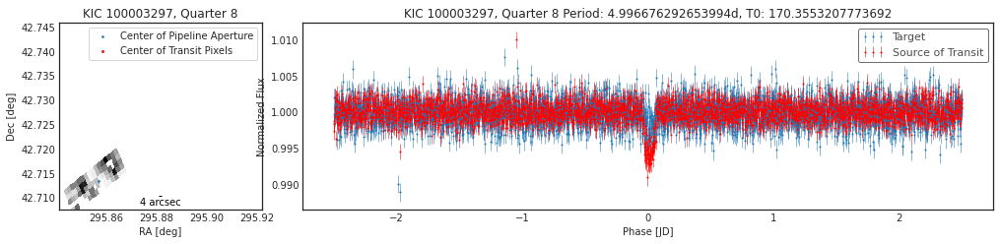

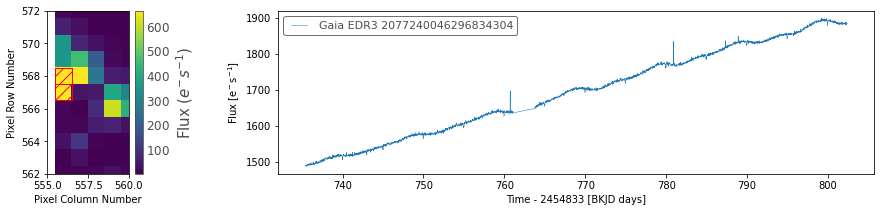

In [6]:
g304_tpfs = {}
g304_ctm_lc = {}
g304_ctm_ap = {}
g304_masked_tpfs= {}

for fname in file_names:
    g304_lc = lk.KeplerLightCurve.read(fname)
    g304_tpf = lk.KeplerTargetPixelFile('../data/fits/exba/q%i/ch%02i/%s' %
                                        (g304_lc.quarter, g304_lc.channel, g304_lc.TPF_ORGN))
    hdu = fits.open(fname)
    ap_mask = hdu[9].data[:, :9]
    g304_col, g304_row = int(np.maximum(g304_lc.meta["COLUMN"] - g304_tpf.column, 0)), int(g304_lc.meta["ROW"] - g304_tpf.row)
    print(g304_col, g304_row)
    
    gen_mask = ap_mask.copy()
    gen_mask[g304_row - 8 : g304_row + 8, g304_col : g304_col + 5] = 1
    g304_tpf_masked = g304_tpf * gen_mask
    
    # contaminante
    
    result = ctm.calculate_contamination(g304_tpf_masked, period, t0, duration, 
                                         plot=True, sff=False, spline_period=0.5, cbvs=True)
    plt.show()
    
    ctm_mask = result[0]["contaminator_aper"]
    
    # light curve using contaminante aperture mask
    
    fig = plt.figure(figsize=(15, 3))
    plt.subplots_adjust(wspace=1.1, hspace=0.25)
    
    sub1 = fig.add_subplot(1, 4, 1)
    g304_tpf.plot(aperture_mask=ctm_mask, ax=sub1)
    sub1.set_title("")
    sub1.set_ylim(int(g304_lc.meta["ROW"] - 5), 
             int(g304_lc.meta["ROW"] + 5))
    sub1.set_xlim(int(np.maximum(g304_lc.meta["COLUMN"] - 5, g304_tpf.column - .5)), 
             int(g304_lc.meta["COLUMN"] + 5))
    
    
    lc = g304_tpf.to_lightcurve(aperture_mask=ctm_mask)
    lc.label = g304_lc.label
    
    sub2 = fig.add_subplot(1, 4, (2, 4))
    lc.plot(ax=sub2, label=hdu[0].header["LABEL"])
    plt.show()
    
    g304_tpfs[g304_lc.quarter] = g304_tpf
    g304_masked_tpfs[g304_lc.quarter] = g304_tpf_masked
    g304_ctm_lc[g304_tpf.quarter] = lc
    g304_ctm_ap[g304_tpf.quarter] = ctm_mask
    
    # # do vetting
    # vet = centroid_test(g304_tpf_masked, period, t0, duration, aperture_mask=ctm_mask, plot=True)
    # plt.show()

    
    # break

# LC from KIC 7214804

In [7]:
k804_tpfs = lk.search_targetpixelfile("KIC 7214804",
                                      author="Kepler", 
                                      cadence="long").download_all()
k804_tpfs

TargetPixelFileCollection of 15 objects:
    0: KeplerTargetPixelFile Object (ID: 7214804)
    1: KeplerTargetPixelFile Object (ID: 7214804)
    2: KeplerTargetPixelFile Object (ID: 7214804)
    3: KeplerTargetPixelFile Object (ID: 7214804)
    4: KeplerTargetPixelFile Object (ID: 7214804)
    5: KeplerTargetPixelFile Object (ID: 7214804)
    6: KeplerTargetPixelFile Object (ID: 7214804)
    7: KeplerTargetPixelFile Object (ID: 7214804)
    8: KeplerTargetPixelFile Object (ID: 7214804)
    9: KeplerTargetPixelFile Object (ID: 7214804)
    10: KeplerTargetPixelFile Object (ID: 7214804)
    11: KeplerTargetPixelFile Object (ID: 7214804)
    12: KeplerTargetPixelFile Object (ID: 7214804)
    13: KeplerTargetPixelFile Object (ID: 7214804)
    14: KeplerTargetPixelFile Object (ID: 7214804)

In [8]:
k804_tpfs_d = {tpf.quarter: tpf for tpf in k804_tpfs}

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.64s/it]


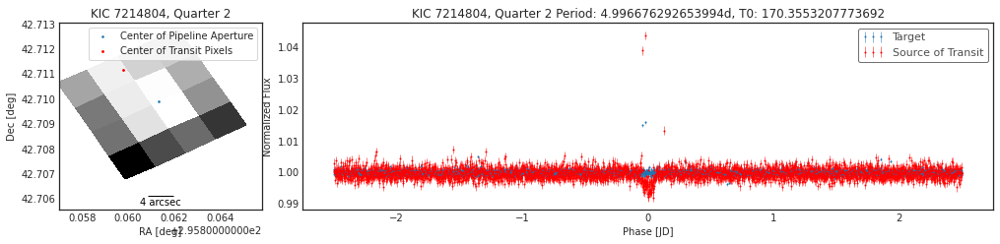

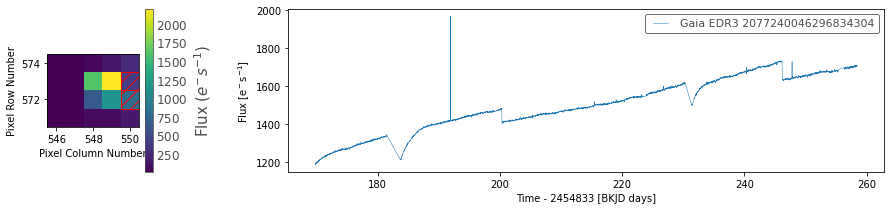

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.54s/it]


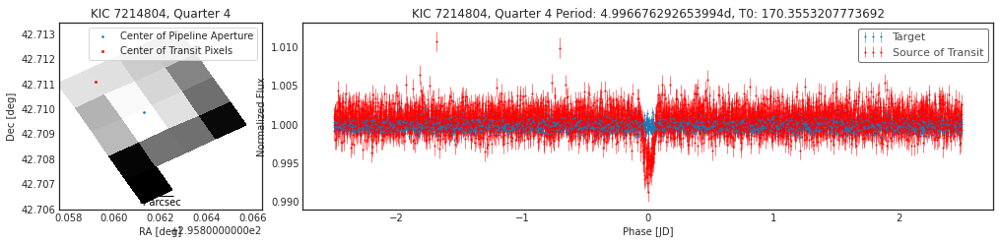

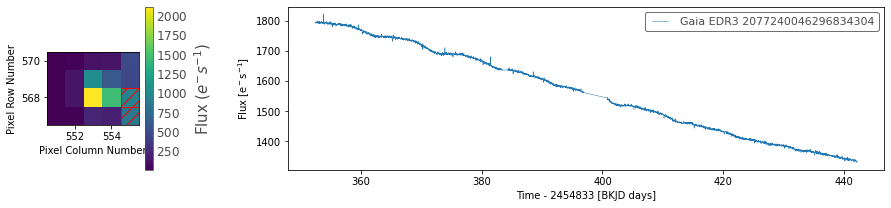

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.88s/it]


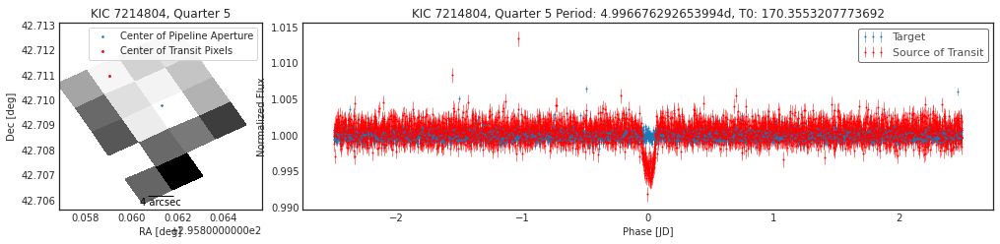

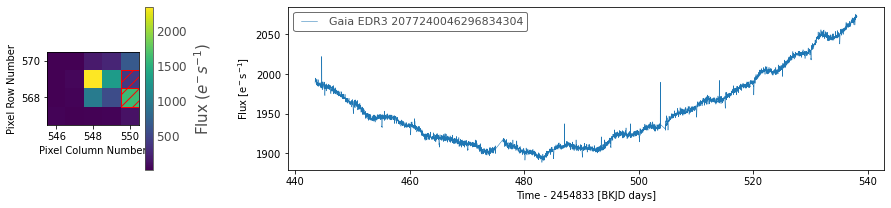

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.89s/it]


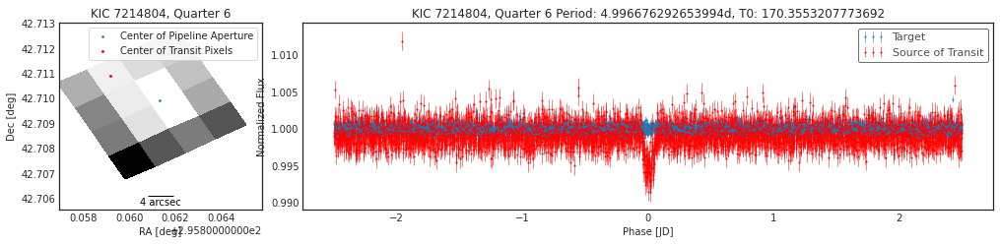

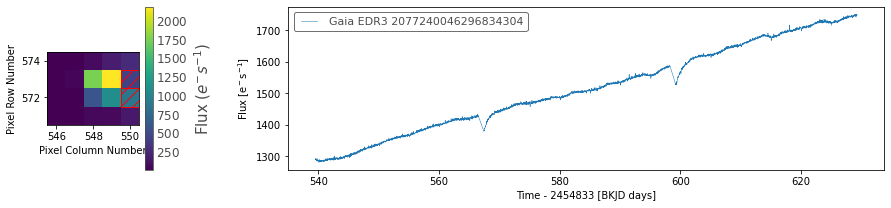

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.53s/it]


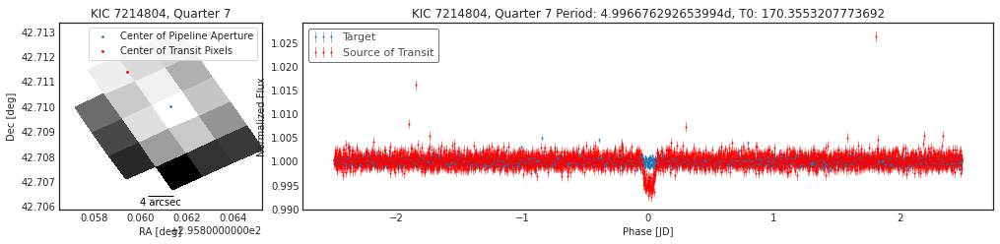

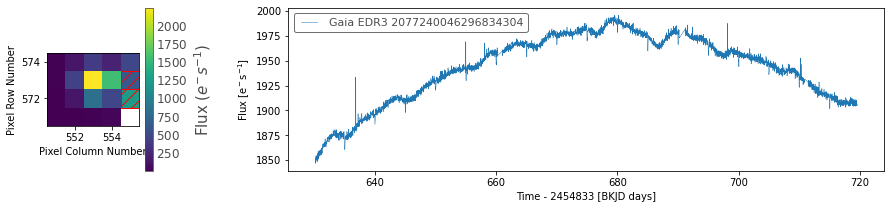

Modeling TPFs: 100%|██████████| 1/1 [00:02<00:00,  2.99s/it]


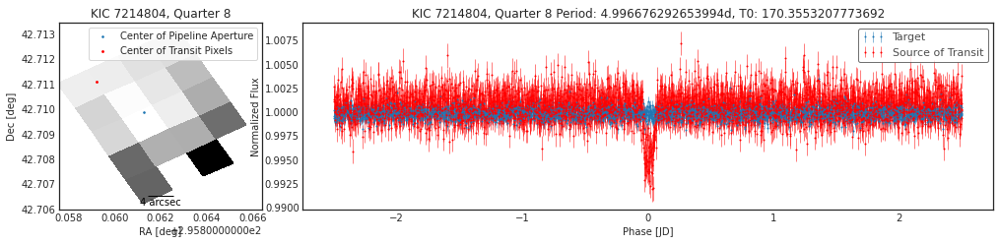

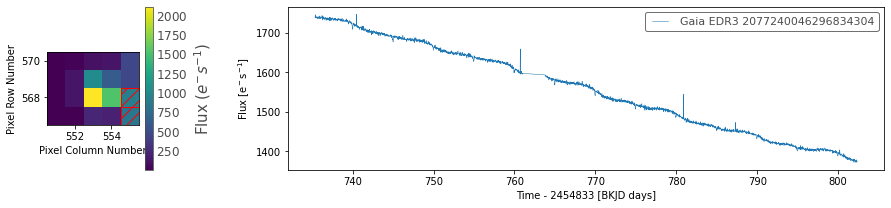

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.94s/it]


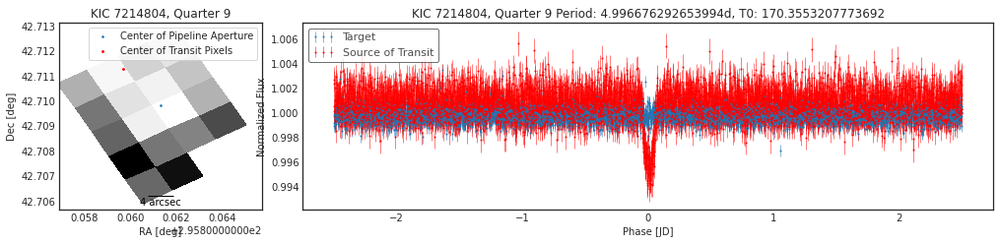

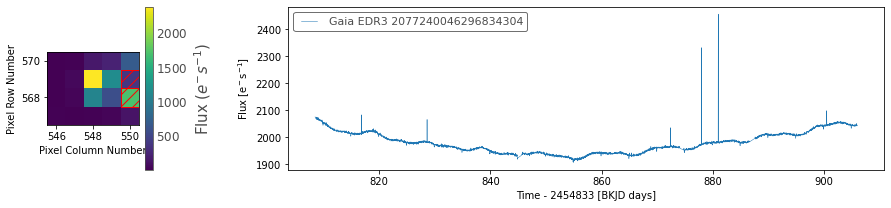

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.87s/it]


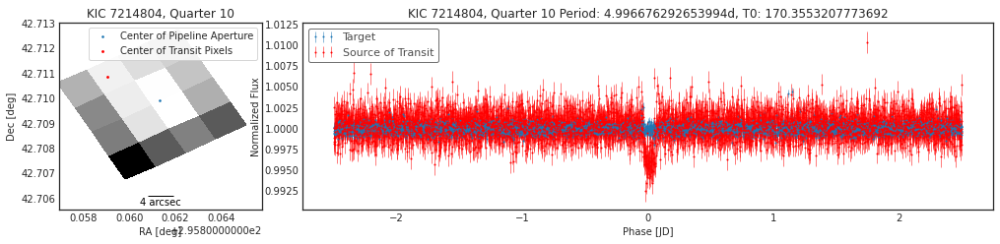

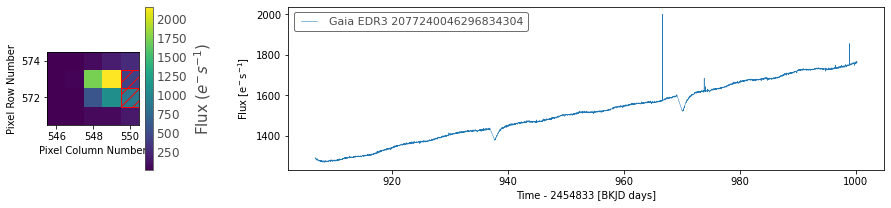

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.92s/it]


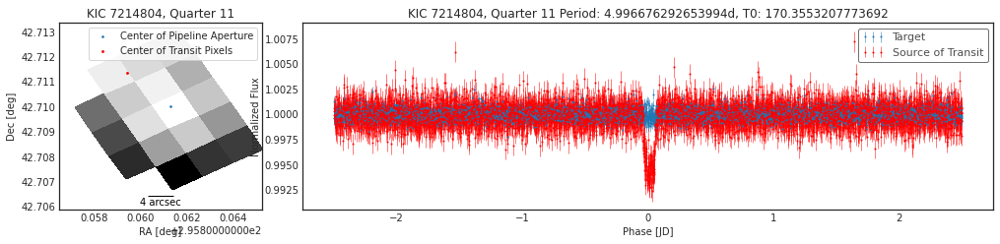

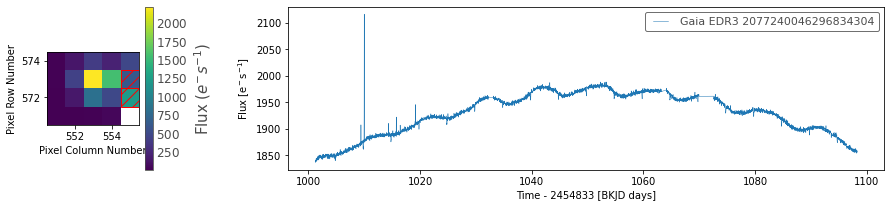

Modeling TPFs: 100%|██████████| 1/1 [00:04<00:00,  4.87s/it]


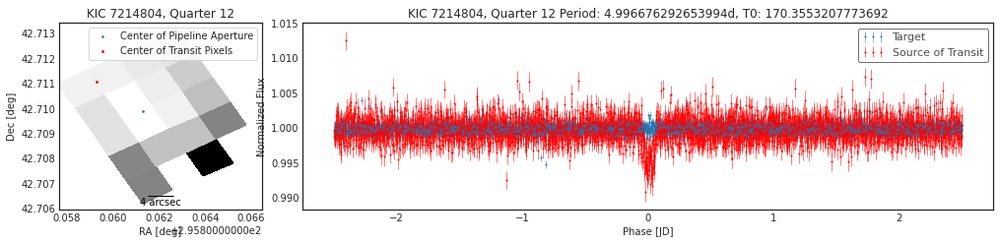

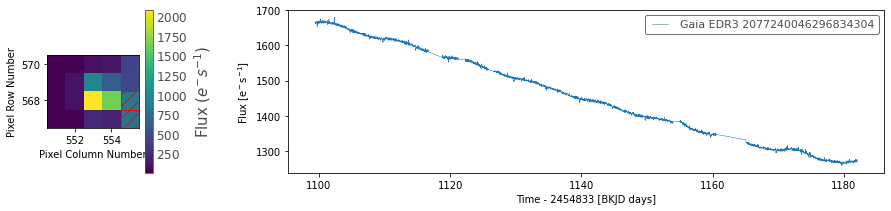

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.91s/it]


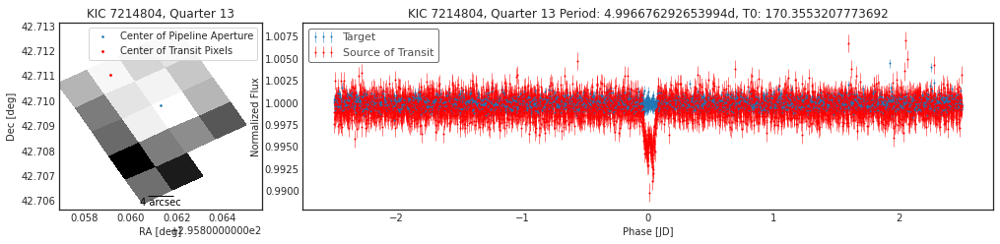

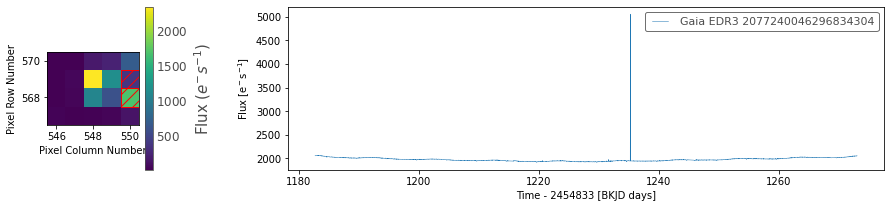

Modeling TPFs: 100%|██████████| 1/1 [00:05<00:00,  5.33s/it]


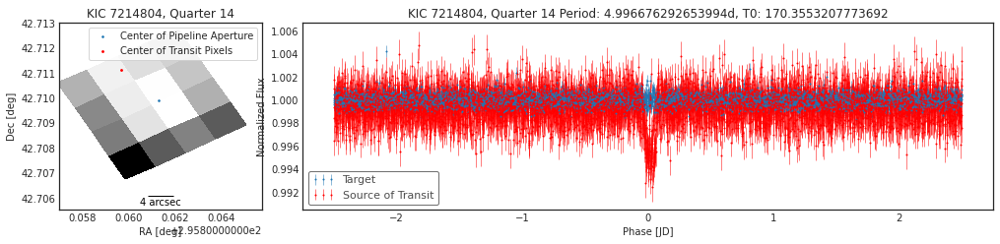

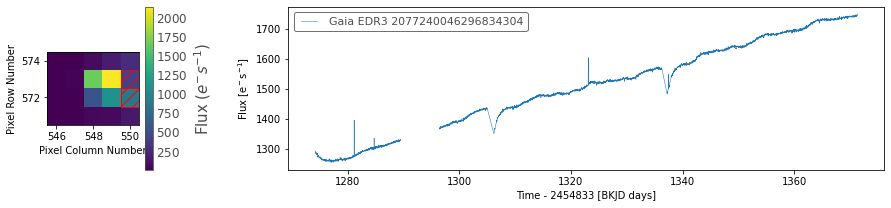

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.67s/it]


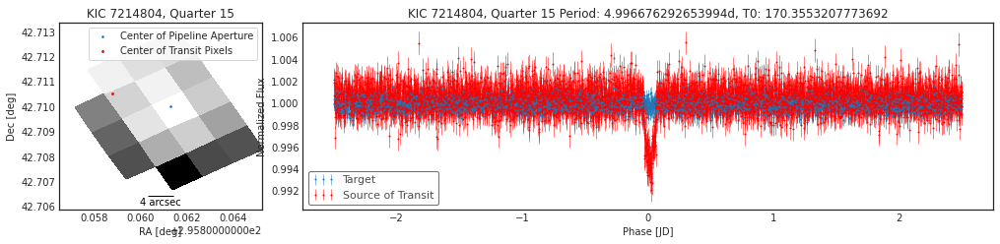

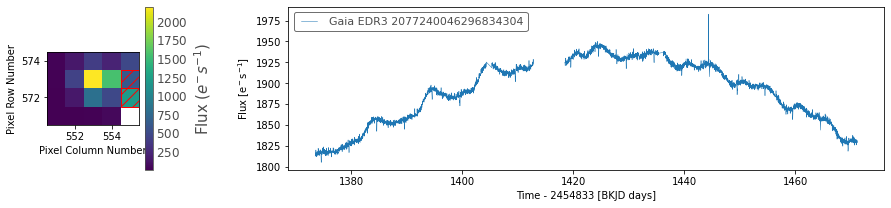

Modeling TPFs: 100%|██████████| 1/1 [00:03<00:00,  3.04s/it]


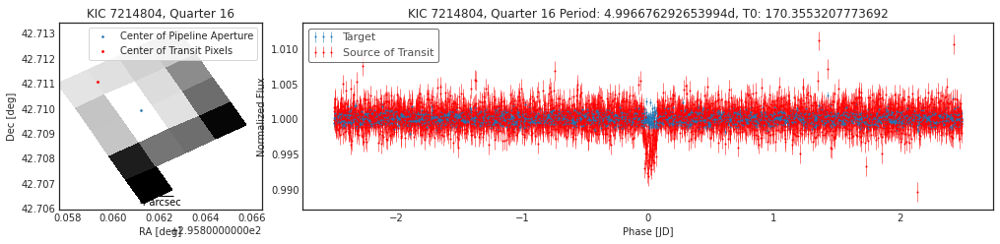

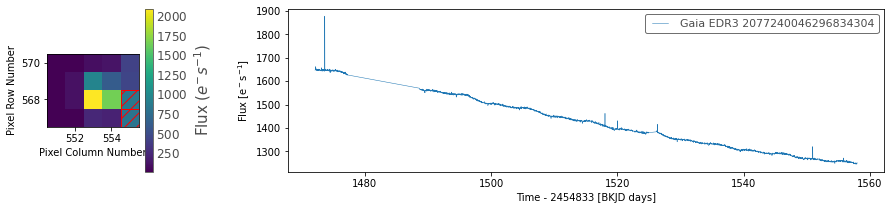

Modeling TPFs: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


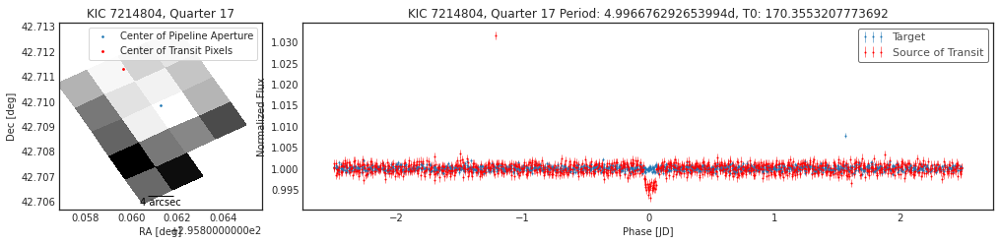

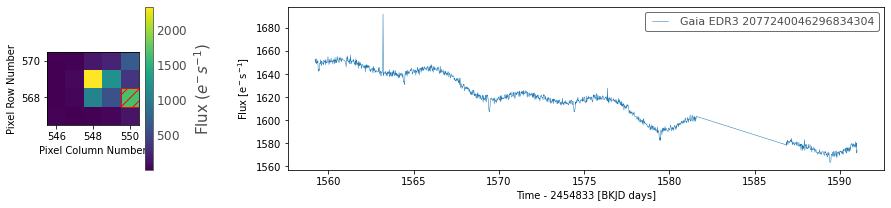

In [9]:
k804_ctm_lc = {}
k804_ctm_ap = {}
for tpf in k804_tpfs:
    # contaminante
    result = ctm.calculate_contamination(tpf, period, t0, duration, 
                                         plot=True, sff=False, 
                                         spline_period=0.5, cbvs=True)
    plt.show()
    
    ctm_mask = result[0]["contaminator_aper"]
    
    fig = plt.figure(figsize=(15, 3))
    plt.subplots_adjust(wspace=1.1, hspace=0.25)
    
    sub1 = fig.add_subplot(1, 4, 1)
    tpf.plot(aperture_mask=ctm_mask, ax=sub1)
    sub1.set_title("")
    
    lc = tpf.to_lightcurve(aperture_mask=ctm_mask)
    lc.label = g304_lc.label
    
    sub2 = fig.add_subplot(1, 4, (2, 4))
    lc.plot(ax=sub2)
    plt.show()
    
    k804_ctm_lc[tpf.quarter] = lc
    k804_ctm_ap[tpf.quarter] = ctm_mask
    
    # do vetting
    # vet = centroid_test(tpf, period, t0, duration, aperture_mask="pipeline", plot=True)
    # plt.show()

In [10]:
combined_lc = {}

for q in k804_ctm_lc.keys():
    if q in g304_ctm_lc.keys():
        combined_lc[q] = k804_ctm_lc[q] + g304_ctm_lc[q]
    else:
        combined_lc[q] = k804_ctm_lc[q]

/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:506: LightkurveWarning: Two LightCurve objects with inconsistent time values are being added.
  warnings.warn(


In [11]:
combined_lcc = lk.LightCurveCollection(combined_lc.values())
combined_lcc

LightCurveCollection of 15 objects:
    0: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=2 CAMPAIGN=None>
    1: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=4 CAMPAIGN=None>
    2: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=5 CAMPAIGN=None>
    3: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=6 CAMPAIGN=None>
    4: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=7 CAMPAIGN=None>
    5: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=8 CAMPAIGN=None>
    6: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=9 CAMPAIGN=None>
    7: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=10 CAMPAIGN=None>
    8: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=11 CAMPAIGN=None>
    9: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=12 CAMPAIGN=None>
    10: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=13 CAMPAI

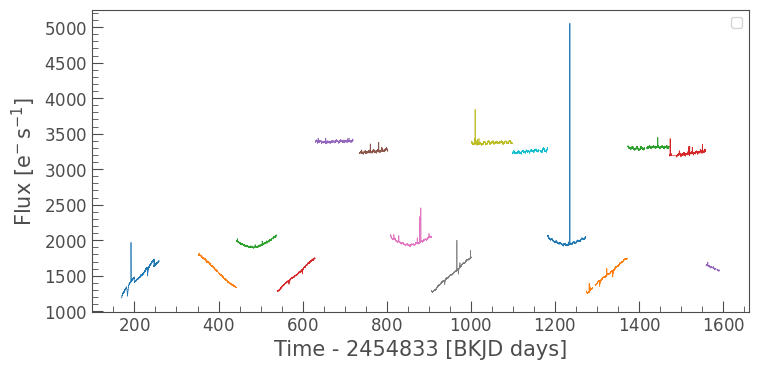

In [12]:
combined_lcc.plot()
plt.legend("")

# Using Regression Corrector

In [60]:
def correct_lc(lc, plot=False, spline=True):
    # creating Design matrix
    times = lc.time.jd
    breaks = list(np.where(np.diff(times) > 0.3)[0] + 1)
    # spline DM
    n_knots = int((lc.time[-1] - lc.time[0]).value / 0.8)
    spline_dm = lk.designmatrix.create_spline_matrix(
        times,
        n_knots=n_knots,
        include_intercept=True,
        name="spline_dm",
    )#.split(breaks)
    spline_dm = lk.DesignMatrix(
        spline_dm.X[:, spline_dm.X.sum(axis=0) != 0], name="spline_dm"
    )
    # offset matrix
    offset_dm = lk.DesignMatrix(np.ones_like(times), name="offset")#.split(breaks)
    offset_dm.prior_mu = np.ones(1)
    offset_dm.prior_sigma = np.ones(1) * 0.000001

    # DM with CBVs, first 4 only
    cbvs = lk.correctors.download_kepler_cbvs(
        mission="Kepler", quarter=lc.meta["QUARTER"], channel=lc.meta["CHANNEL"]
    )
    basis = 8
    cbv_dm = cbvs[
        np.in1d(cbvs.cadenceno.value, lc.cadenceno.value)
    ].to_designmatrix()
    cbv_dm = lk.DesignMatrix(cbv_dm.X[:, :basis], name="cbv").split(breaks)
    cbv_dm.prior_mu = np.ones(basis * (len(breaks)+ 1))
    cbv_dm.prior_sigma = np.ones(basis * (len(breaks)+ 1)) * 10

    # collection of DMs
    if spline:
        dmc = lk.DesignMatrixCollection([offset_dm, cbv_dm, spline_dm])
    else:
        dmc = lk.DesignMatrixCollection([offset_dm, cbv_dm])
    
    rc = lk.RegressionCorrector(lc)
    clc = rc.correct(dmc, sigma=3)
    if plot:
        rc.diagnose()
        plt.show()
    return clc

2


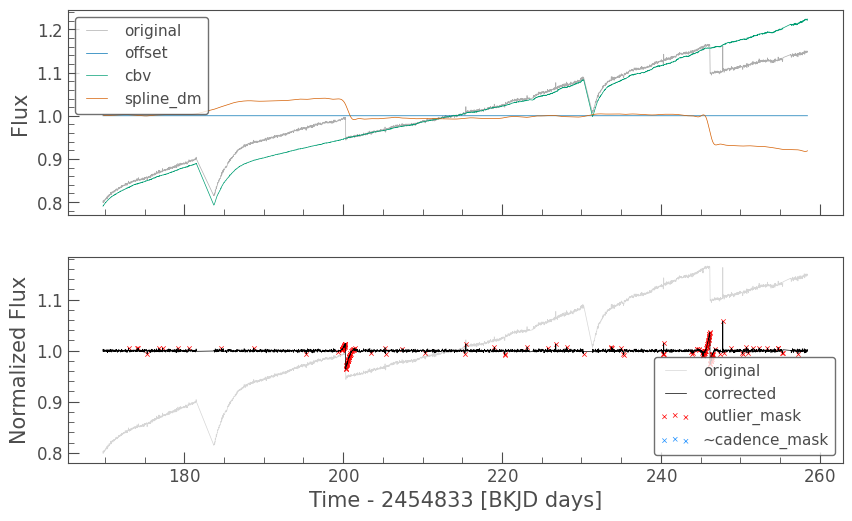

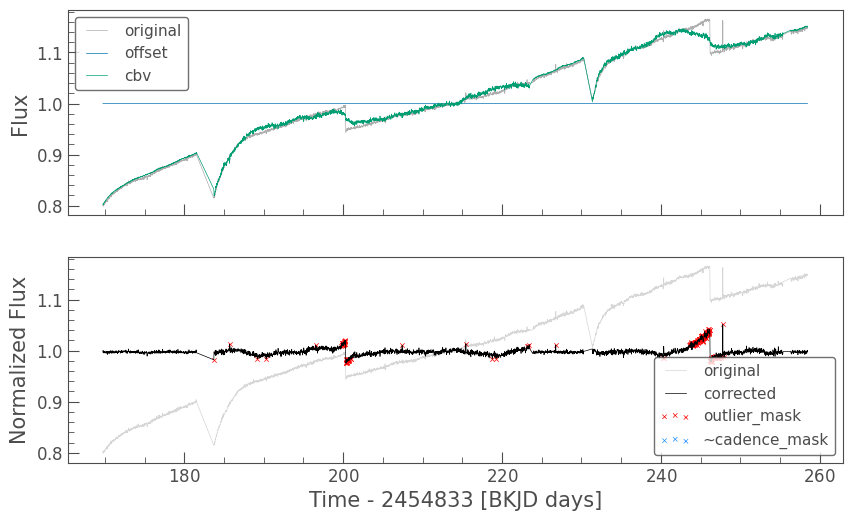

_______________________
4


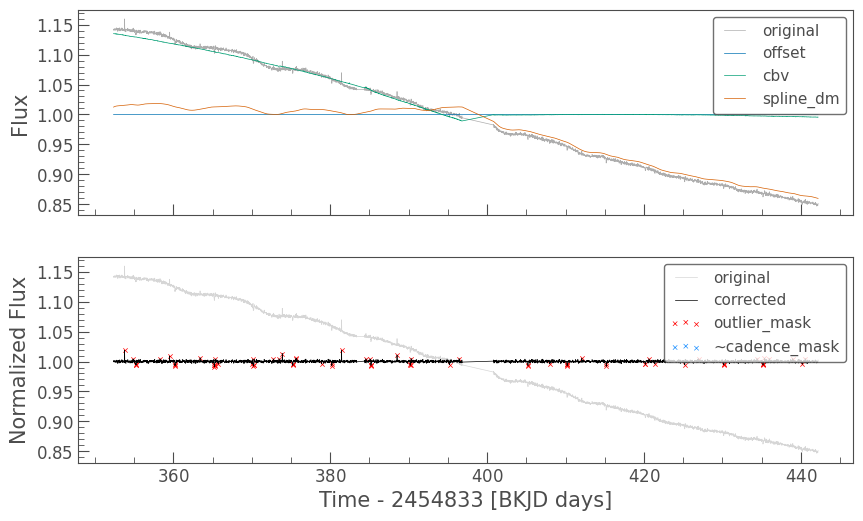

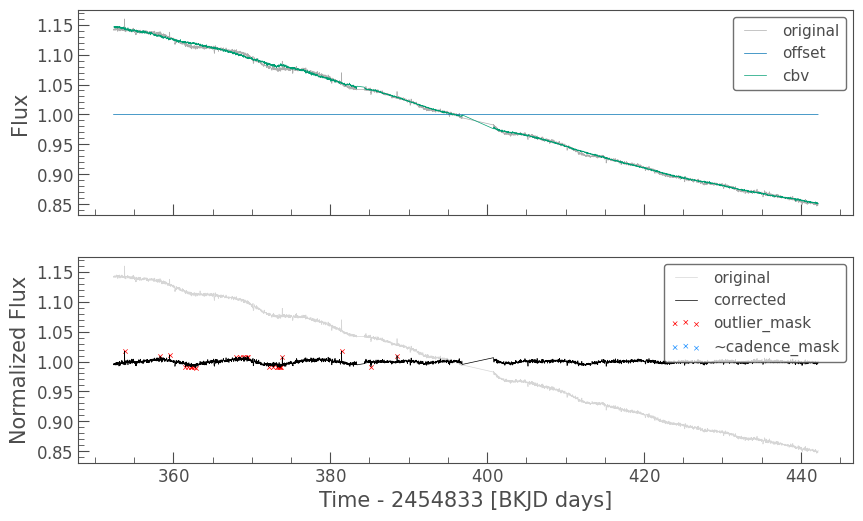

_______________________
5


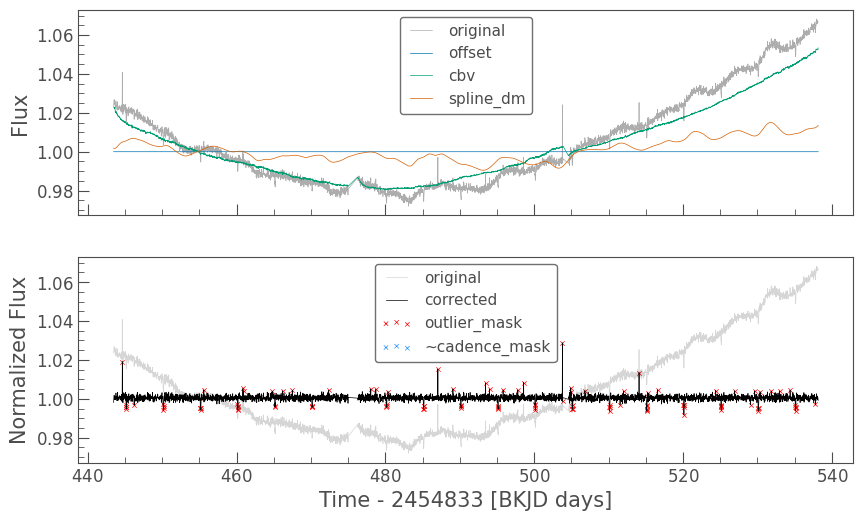

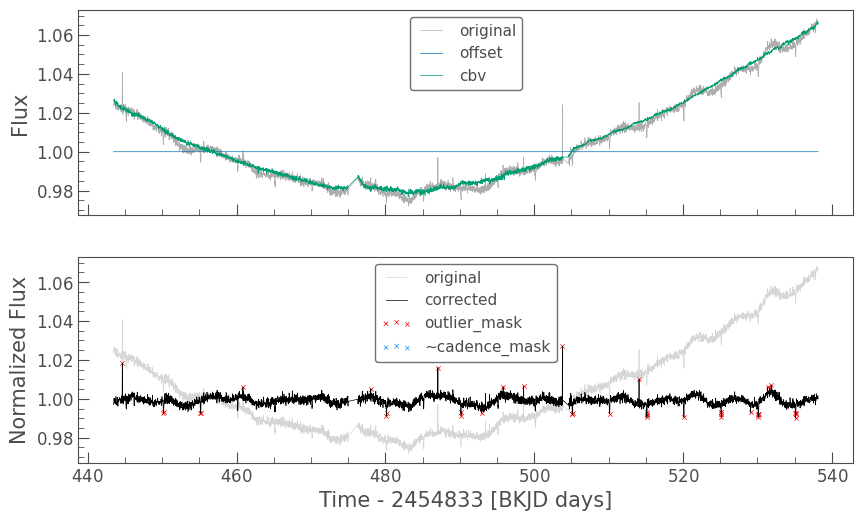

_______________________
6


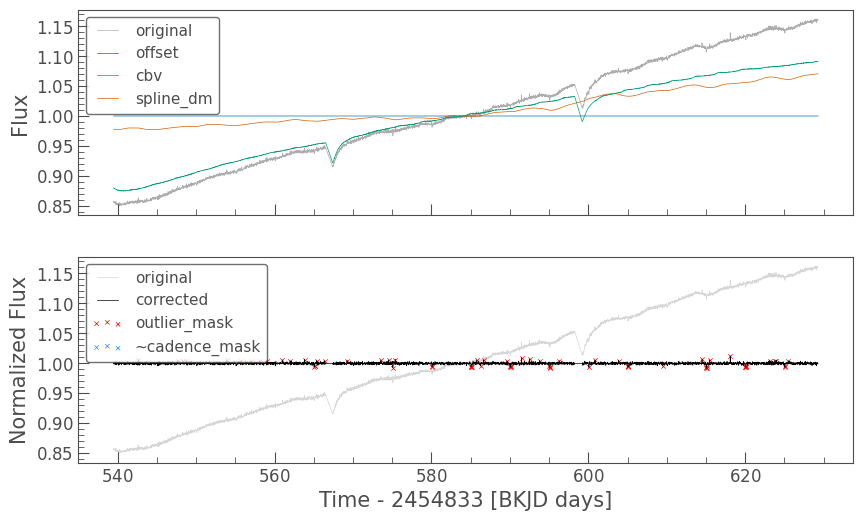

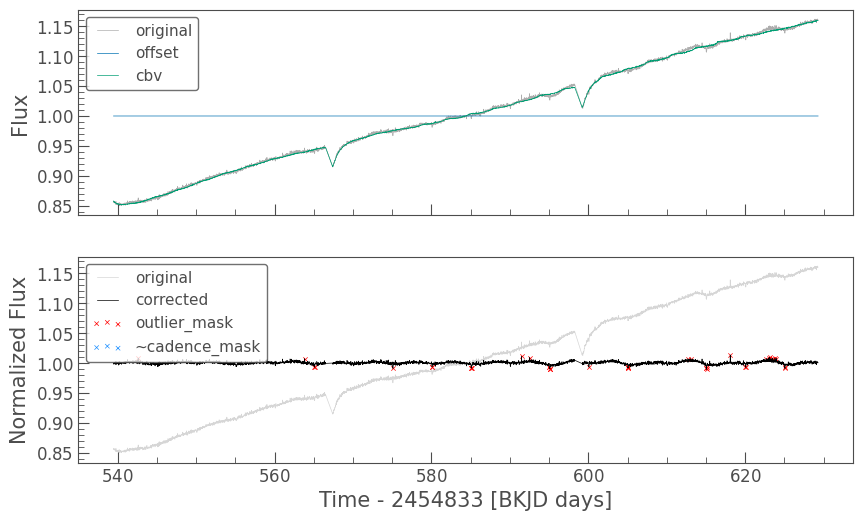

_______________________
7


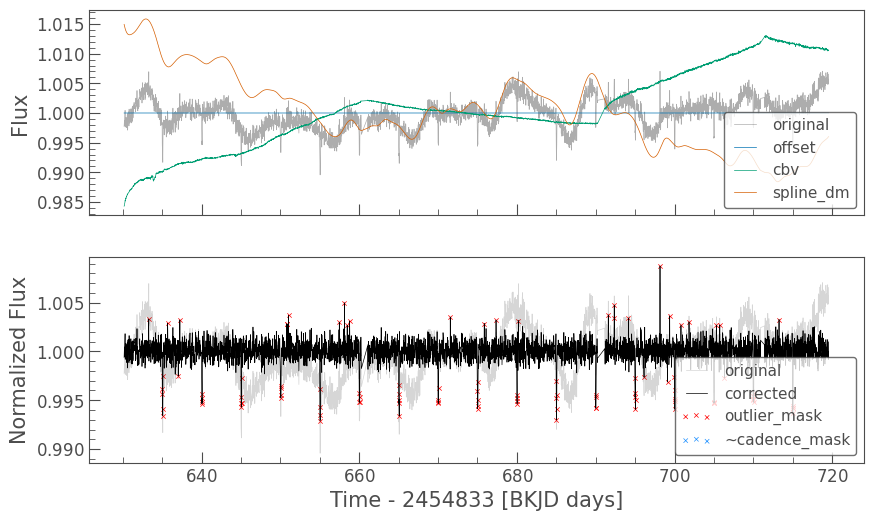

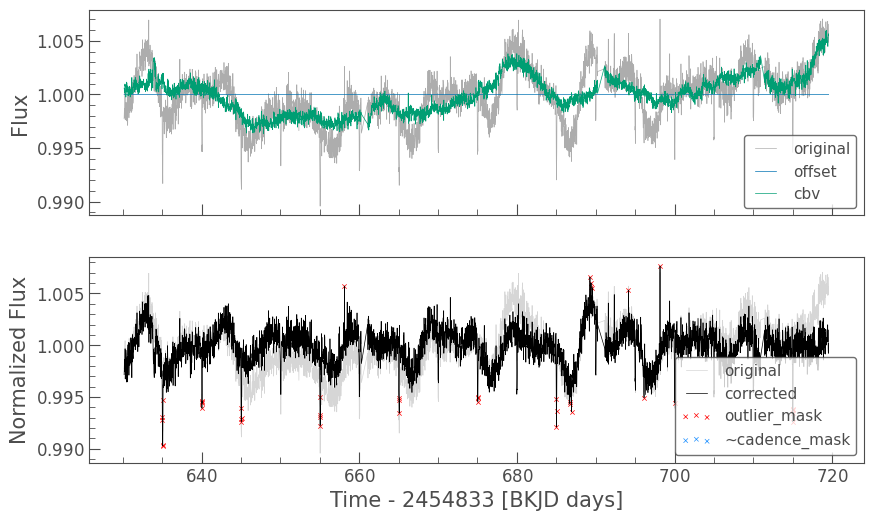

_______________________
8


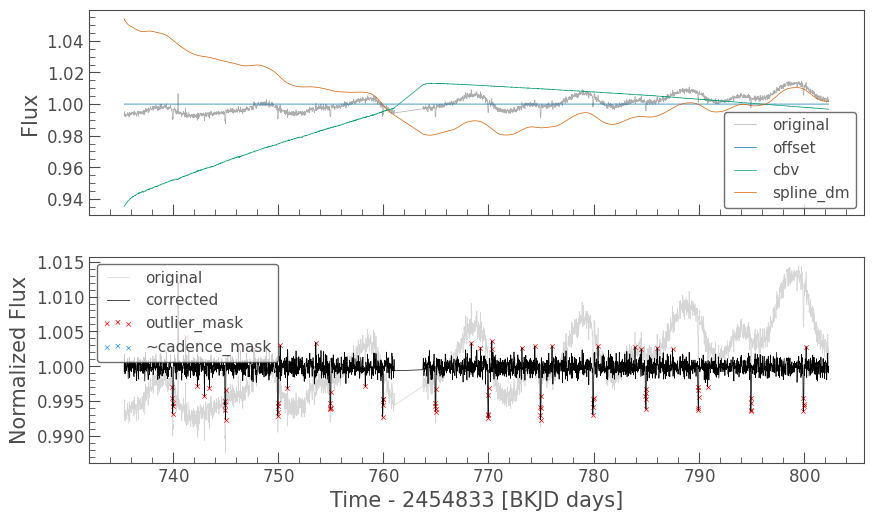

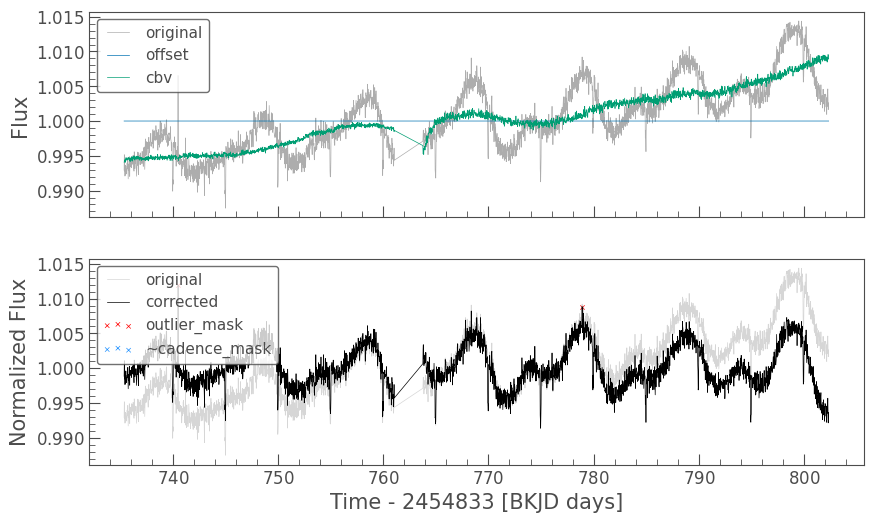

_______________________
9


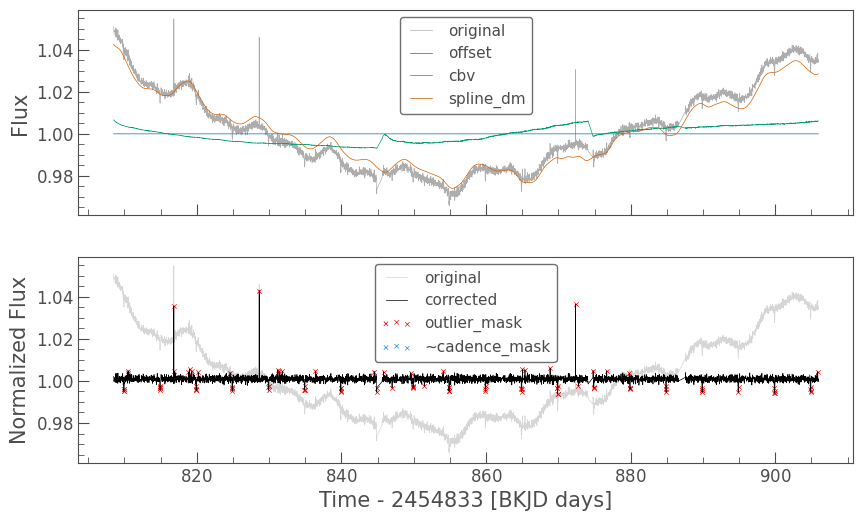

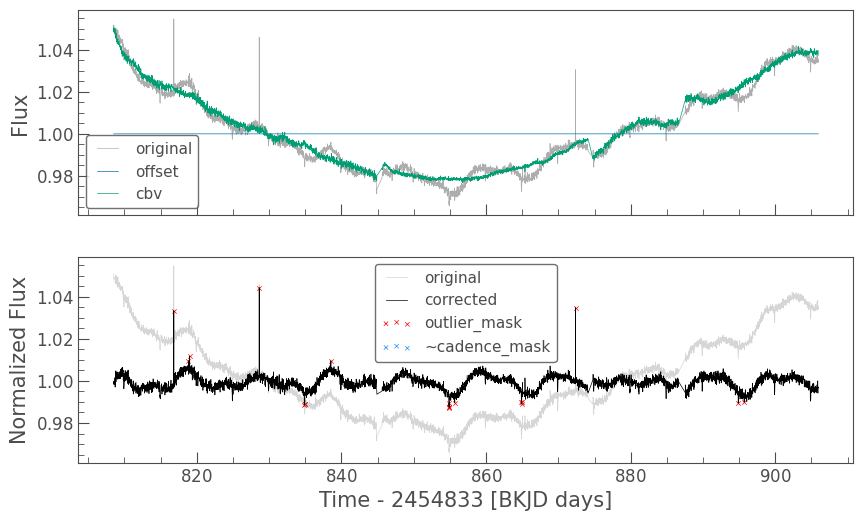

_______________________
10


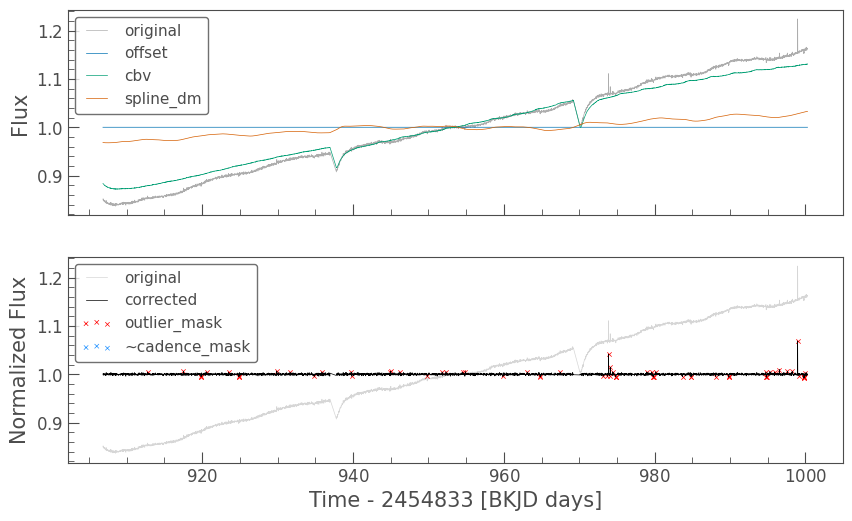

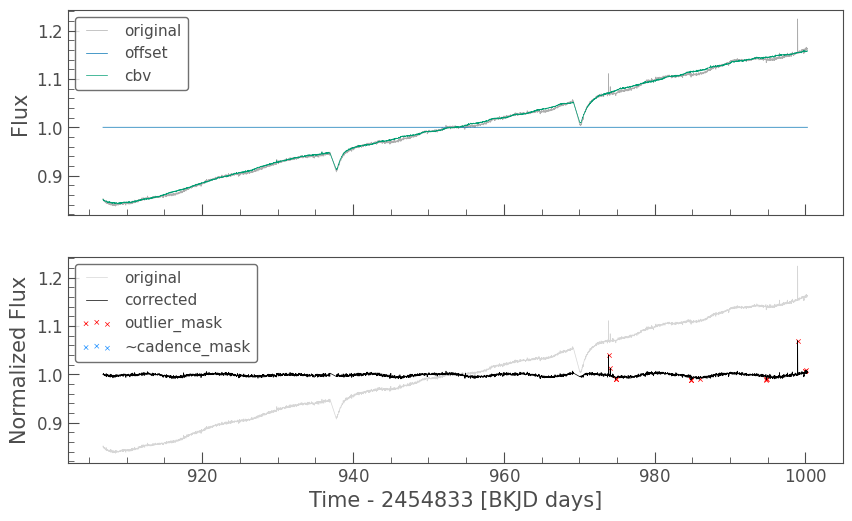

_______________________
11


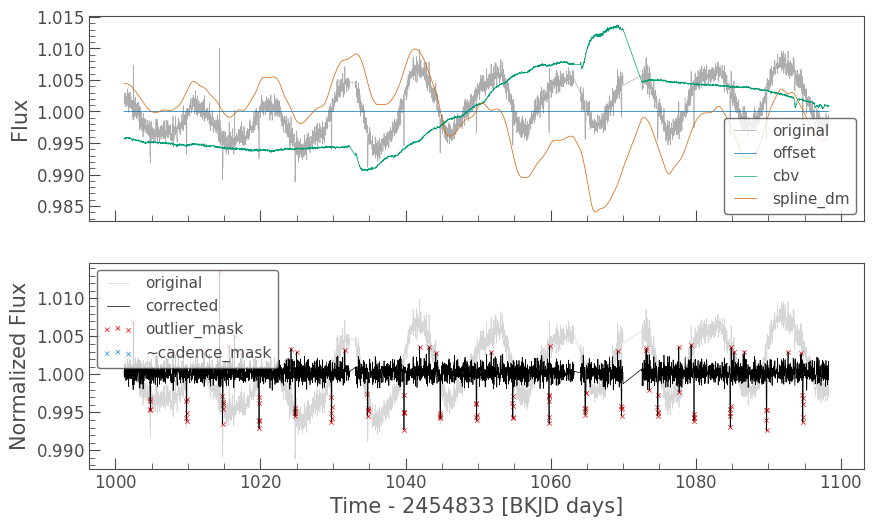

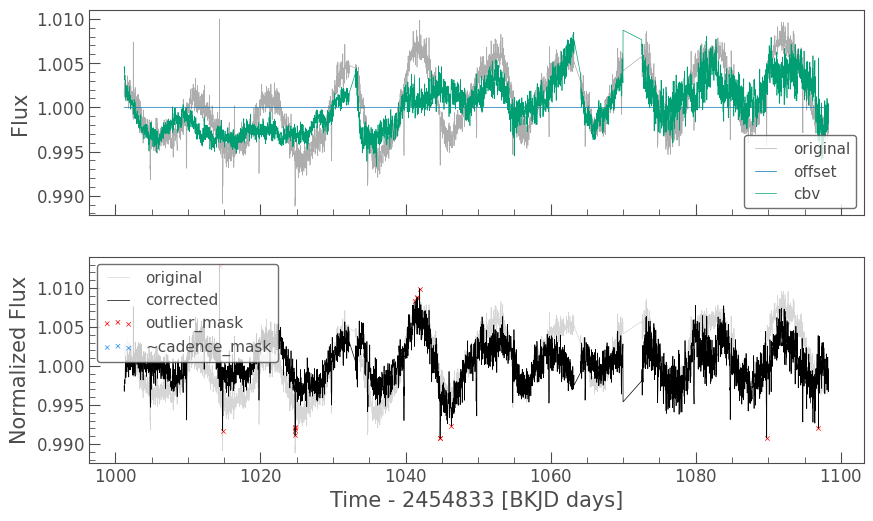

_______________________
12


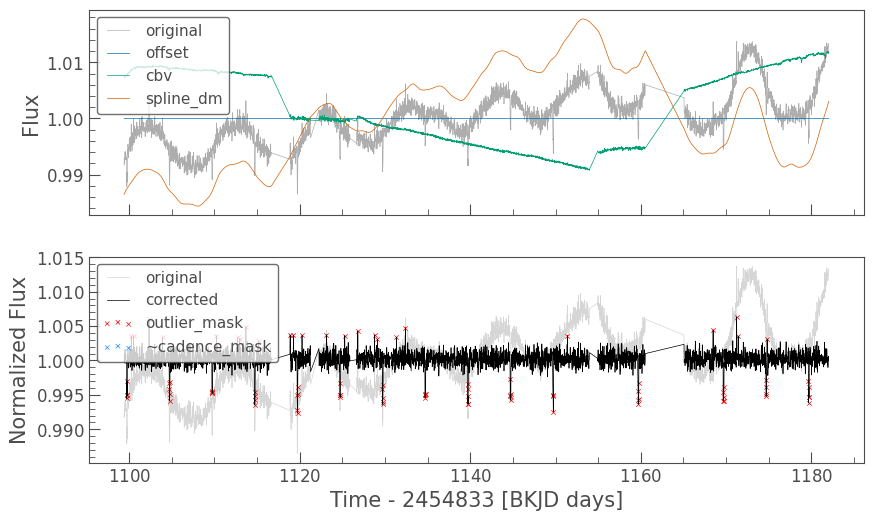

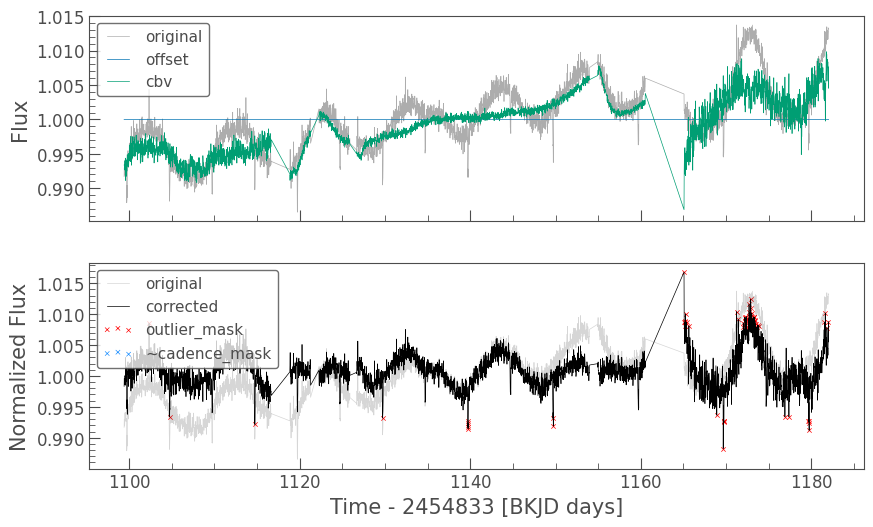

_______________________
13


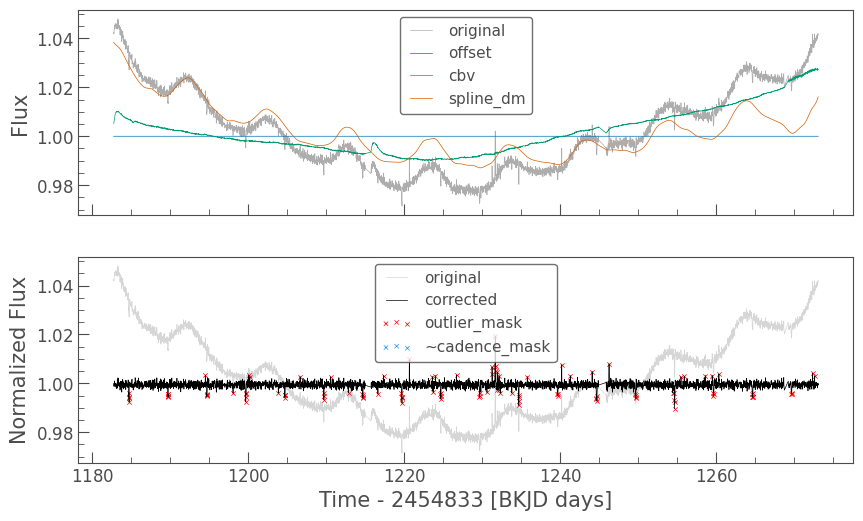

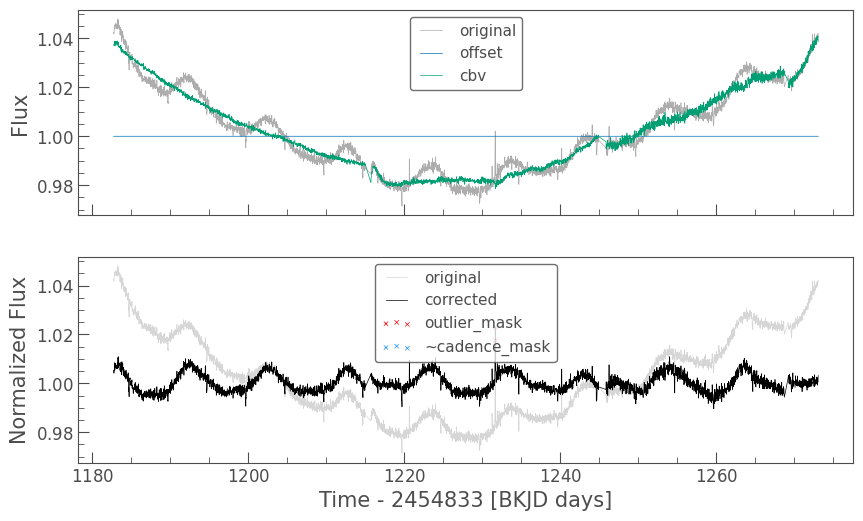

_______________________
14


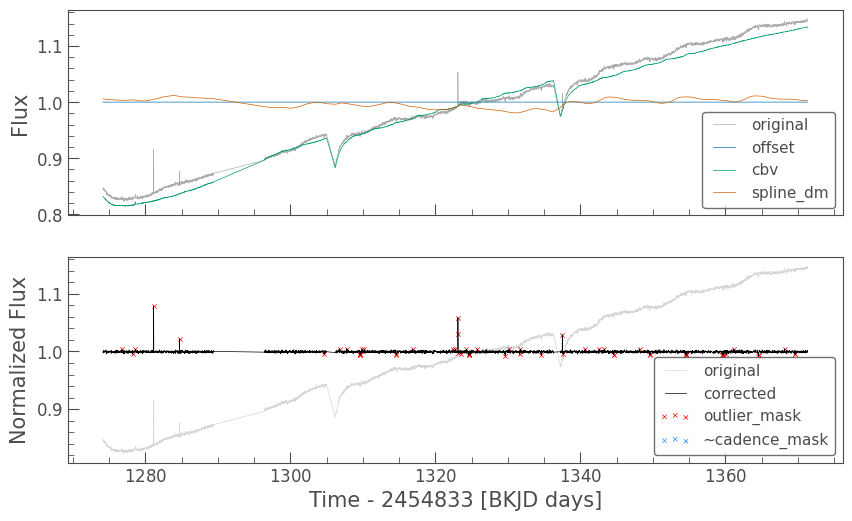

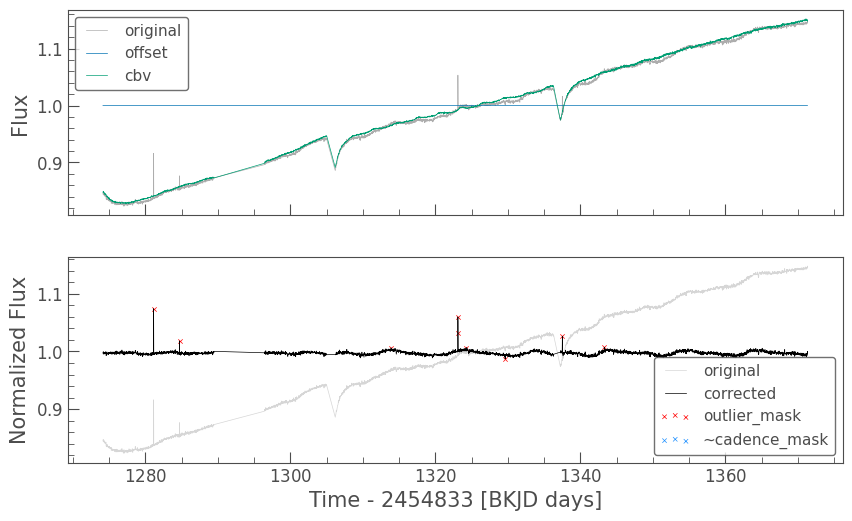

_______________________
15


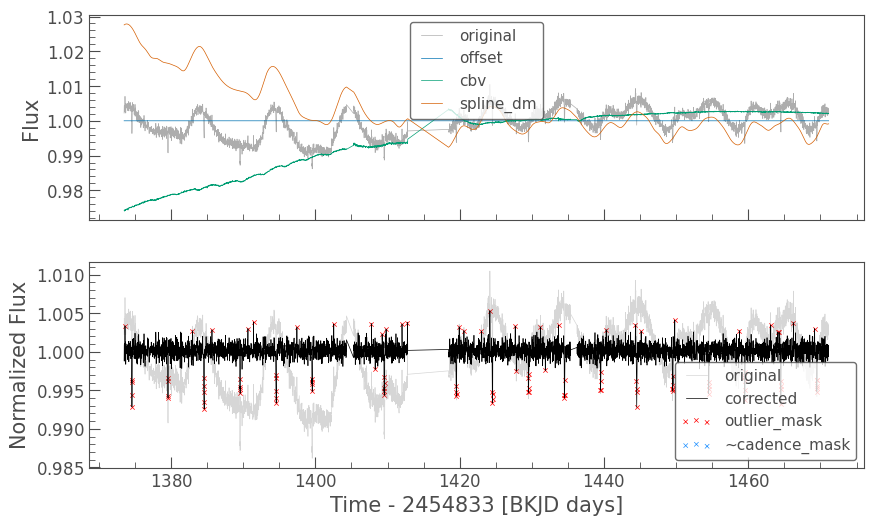

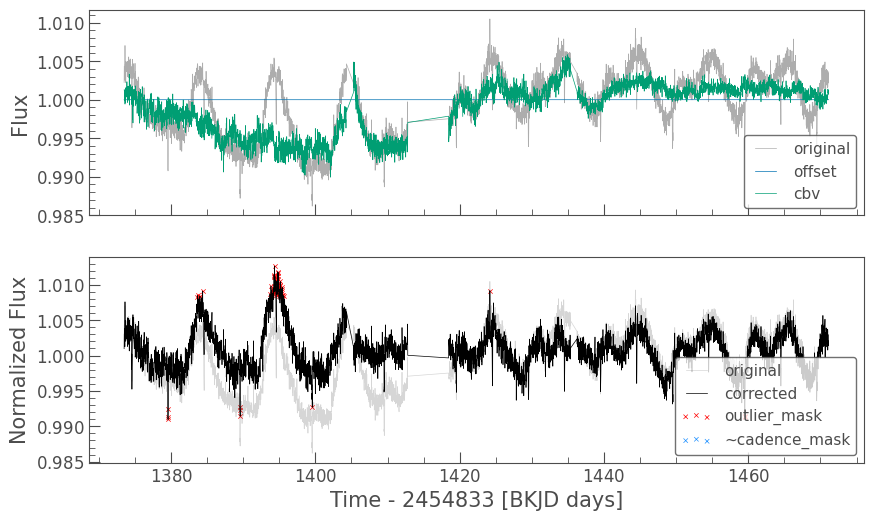

_______________________
16


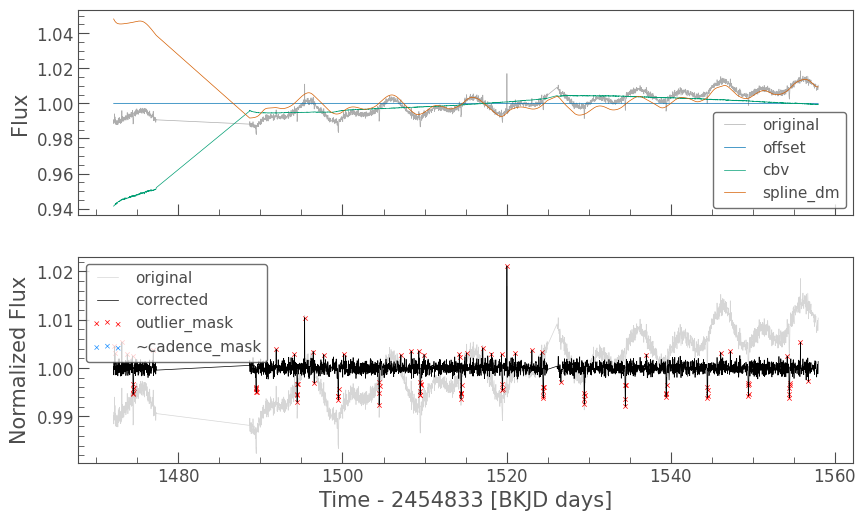

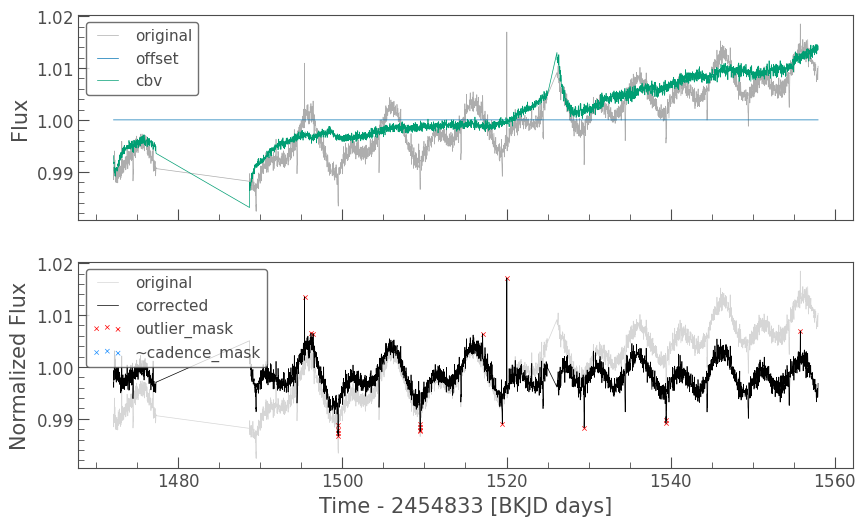

_______________________
17


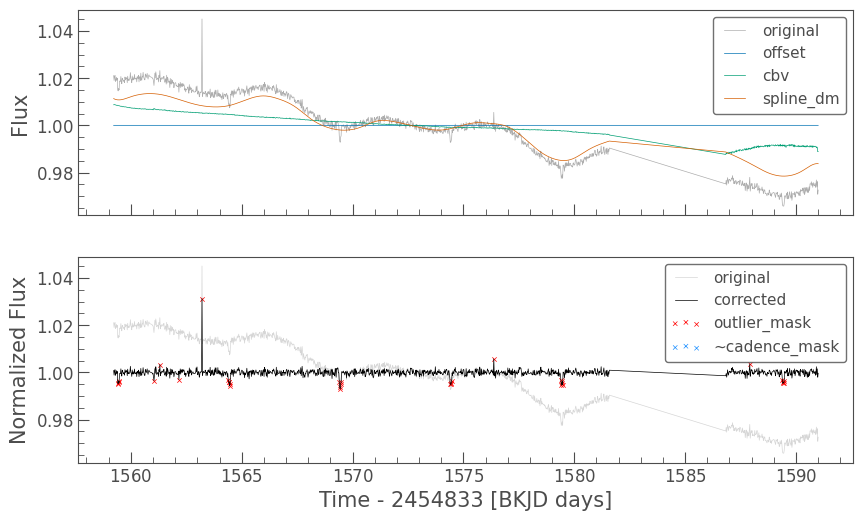

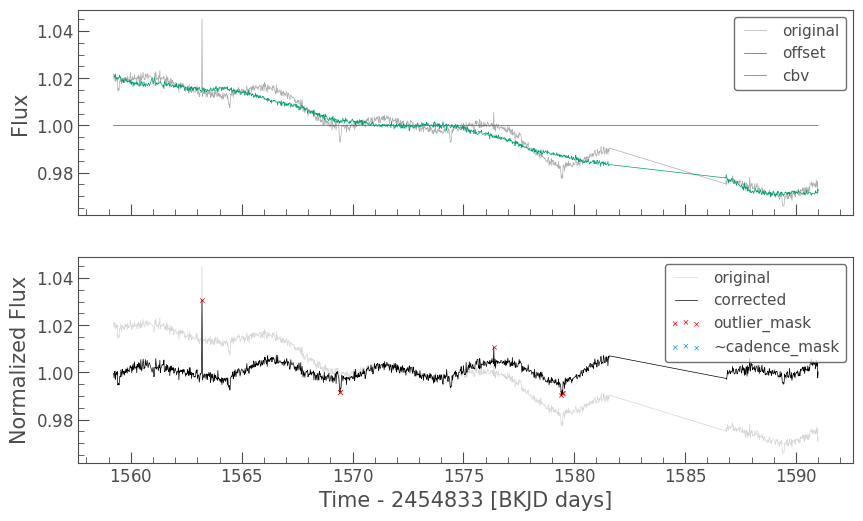

_______________________


In [61]:
regcorr_full_llc = []
regcorr_nosp_llc = []
for lc in combined_lcc:
    print(lc.quarter)
    lc = lc.remove_nans().remove_outliers(sigma_lower=1e10, sigma_upper=3).normalize()
    # if lc.quarter == 2:
    #     mask = np.diff(lc.flux) > 0.2
    #     idx = np.where(mask)[0]
    #     mask_ = mask.copy()
    #     mask_[]
    clc = correct_lc(lc, plot=True, spline=True)
    regcorr_full_llc.append(clc)
    
    clc = correct_lc(lc, plot=True, spline=False)
    regcorr_nosp_llc.append(clc)
    print("_______________________")

In [62]:
test = regcorr_full_llc[0]

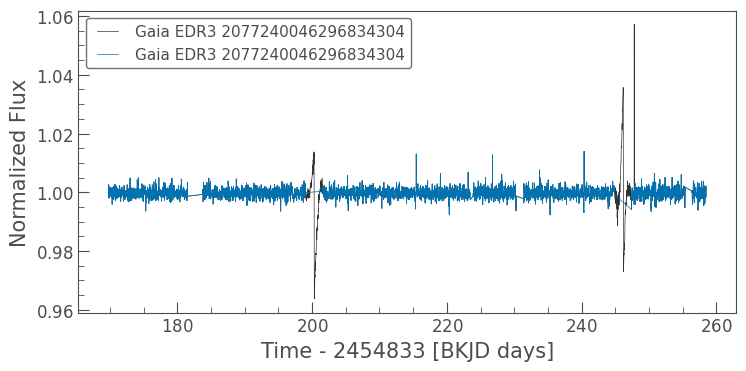

In [63]:
mask = np.diff(test.flux.value) < -0.02
mask = np.append(mask, False)
idx = list(np.where(mask)[0])
n = 60
for pos in idx[:-1]:
    mask[pos - n: pos + n] = True
ax = test.plot()   
test[~mask].plot(ax=ax)
plt.show()

regcorr_full_llc[0] = regcorr_full_llc[0][~mask]
regcorr_nosp_llc[0] = regcorr_nosp_llc[0][~mask]

# Using CBV corrector 

# Stellar Activity

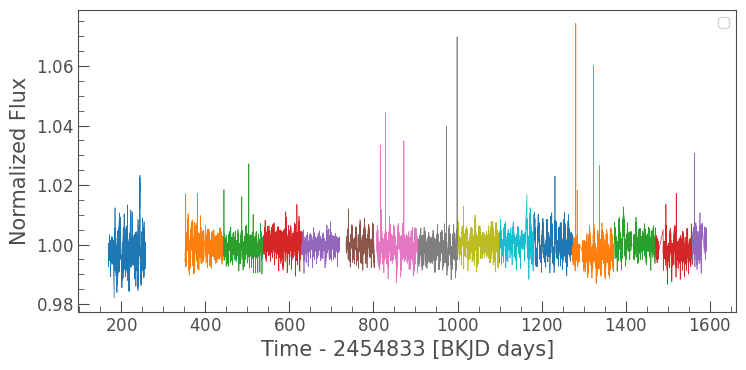

In [64]:
regcorr_nosp_llc = lk.LightCurveCollection([lc for lc in regcorr_nosp_llc])
regcorr_nosp_llc.plot()
plt.legend("")

In [65]:
lc.bin()

time,flux,flux_err,time_bin_start,time_bin_size,centroid_col,centroid_row,cadenceno,quality
,,,,s,pix,pix,,
object,float64,float64,object,float64,float64,float64,int32,int32
1559.4756263898962,1.018659234046936,0.00019545003771781922,1559.2256263898962,43200.0,550.5,568.5,70988,0
1559.9756263898962,1.0198254585266113,0.00019949985047181448,1559.7256263898962,43200.0,550.5,568.5,71012,0
1560.4756263898962,1.0202423334121704,0.00019949752216537794,1560.2256263898962,43200.0,550.5,568.5,71036,0
1560.9756263898962,1.0202527046203613,0.0002243552405975367,1560.7256263898962,43200.0,550.5,568.5,71062,2620
1561.4756263898962,1.0196433067321777,0.0001954592950642109,1561.2256263898962,43200.0,550.5,568.5,71086,1653
1561.9756263898962,1.017433762550354,0.00019933541382973394,1561.7256263898962,43200.0,550.5,568.5,71110,0
1562.4756263898962,1.016069769859314,0.0001952184736728668,1562.2256263898962,43200.0,550.5,568.5,71135,655
1562.9756263898962,1.0155482292175293,0.00019938163071249923,1562.7256263898962,43200.0,550.5,568.5,71159,0


# BLS with stitched light curve

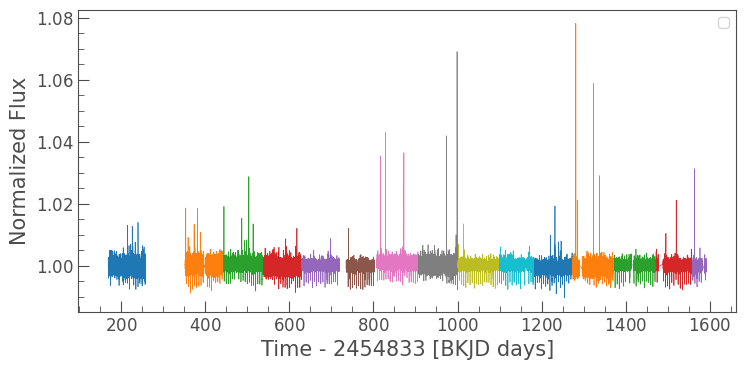

In [66]:
regcorr_llc = lk.LightCurveCollection([lc for lc in regcorr_full_llc])
regcorr_llc.plot()
plt.legend("")

In [67]:
pmin = 4.98
pmax = 5.05
duration = np.linspace(0.07, 0.13, 51)
period = 1 / np.linspace(1/pmin, 1/pmax, 50000)

In [68]:
slc = regcorr_llc.stitch()
periodogram_long = slc.to_periodogram(method="bls", period=period, duration=duration, frequency_factor=1000)

No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


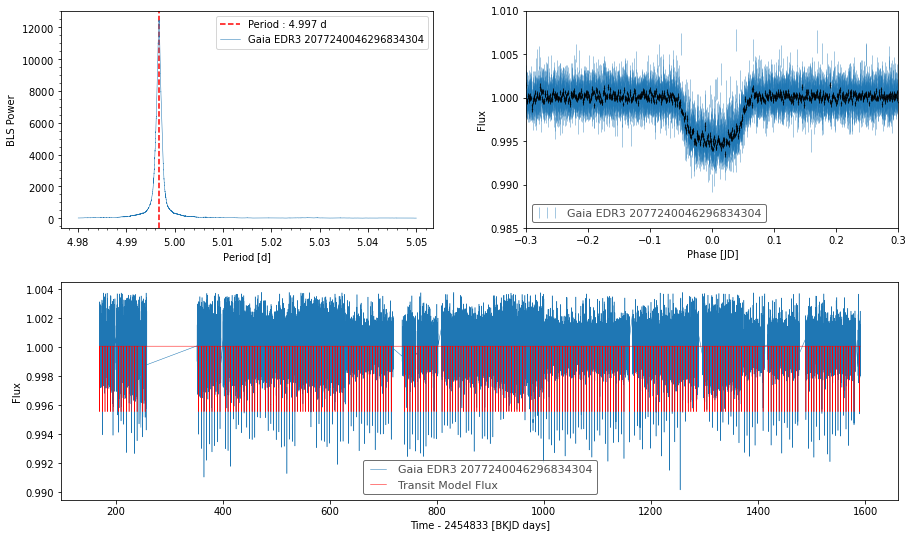

In [69]:
fig = plt.figure(figsize=(15, 9))

plt.subplots_adjust(wspace=0.25, hspace=0.25)

sub1 = fig.add_subplot(2, 2, 1)
sub1.axvline(
    periodogram_long.period_at_max_power.value,
    color="r",
    linestyle="--",
    label="Period : %.3f d"
    % (periodogram_long.period_at_max_power.value),
)
periodogram_long.plot(ax=sub1)
sub1.legend()

sub2 = fig.add_subplot(2, 2, 2)
flc = slc.fold(
    period=periodogram_long.period_at_max_power,
    epoch_time=periodogram_long.transit_time_at_max_power,
)
flc.errorbar(ax=sub2, alpha=0.8)
flc.bin(bins=5000, aggregate_func=np.nanmedian).errorbar(ax=sub2, alpha=0.8, lw=1, c='k', marker=".", ms=1)
sub2.set_xlim(-0.3, 0.3)
sub2.set_ylim(0.985, 1.01)

sub3 = fig.add_subplot(2, 2, (3, 4))
slc.remove_outliers(sigma_lower=1e10, sigma_upper=3).plot(ax=sub3)
periodogram_long.get_transit_model().plot(ax=sub3, color="r")
plt.show()

## Odd-even

In [70]:
bls_stats = periodogram_long.compute_stats()

No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


In [71]:
print("Odd : ", bls_stats["depth_odd"])
print("Even: ", bls_stats["depth_even"])

Odd :  (<Quantity 0.00460234>, <Quantity 4.12140277e-05>)
Even:  (<Quantity 0.00442952>, <Quantity 4.02096994e-05>)


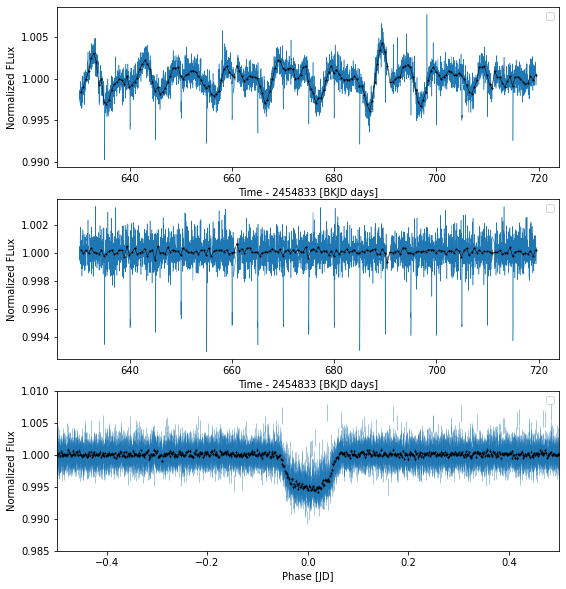

In [72]:
if True:
    fig, ax = plt.subplots(3,1, figsize=(9,10))
    
    regcorr_nosp_llc[4].plot(color="tab:blue", ax=ax[0], rasterized=True)
    regcorr_nosp_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).errorbar(
        ax=ax[0], alpha=1, lw=0.5, c='k', marker=".", ms=2)
    regcorr_nosp_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).plot(
        ax=ax[0], alpha=1, lw=0.5, c='k')
    ax[0].set_ylabel("Normalized FLux")
    ax[0].legend("")
    
    regcorr_full_llc[4].remove_outliers(sigma_lower=1e10, sigma_upper=3).plot(color="tab:blue", ax=ax[1], rasterized=True)
    regcorr_full_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).errorbar(
        ax=ax[1], alpha=1, lw=0.5, c='k', marker=".", ms=2)
    regcorr_full_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).plot(
        ax=ax[1], alpha=1, lw=0.5, c='k')
    ax[1].set_ylabel("Normalized FLux")
    ax[1].legend("")
    
    flc.errorbar(alpha=0.8, c="tab:blue", ax=ax[2], rasterized=True)
    flc.bin(bins=3000, aggregate_func=np.nanmedian).errorbar(
        ax=ax[2], alpha=1, lw=0.5, c='k', marker=".", ms=2)
    ax[2].set_xlim(-0.5, 0.5)
    ax[2].set_ylim(0.985, 1.01)
    ax[2].set_ylabel("Normalized Flux")
    ax[2].legend("")
    # plt.savefig("../data/figures/paper/g304_lc.pdf", 
    #             format="pdf", bbox_inches="tight")
    plt.show()

In [73]:
print("period      : ", periodogram_long.period_at_max_power)
print("duration    : ", periodogram_long.duration_at_max_power)
print("depth       : ", periodogram_long.depth_at_max_power)
print("transit_time: ", periodogram_long.transit_time_at_max_power)

period      :  4.996742290936822 d
duration    :  0.09800000000000002 d
depth       :  0.004513774260852657
transit_time:  170.3533207773692


In [74]:
bflc = flc.bin(bins=4000, aggregate_func=np.nanmedian)
bflc_p = bflc[bflc.time.value > 0]
bflc_n = bflc[bflc.time.value < 0]
bflc_n.time = bflc_n.time * -1

(-0.01, 0.3)

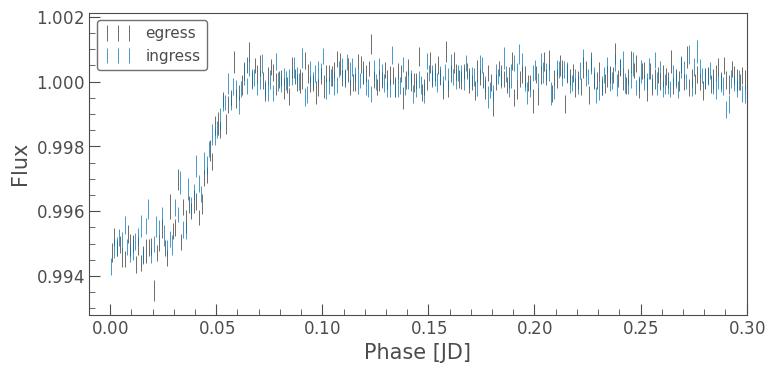

In [75]:
ax = bflc_p.errorbar(label="egress")
bflc_n.errorbar(ax=ax, label="ingress")
ax.set_xlim(-0.01, 0.3)

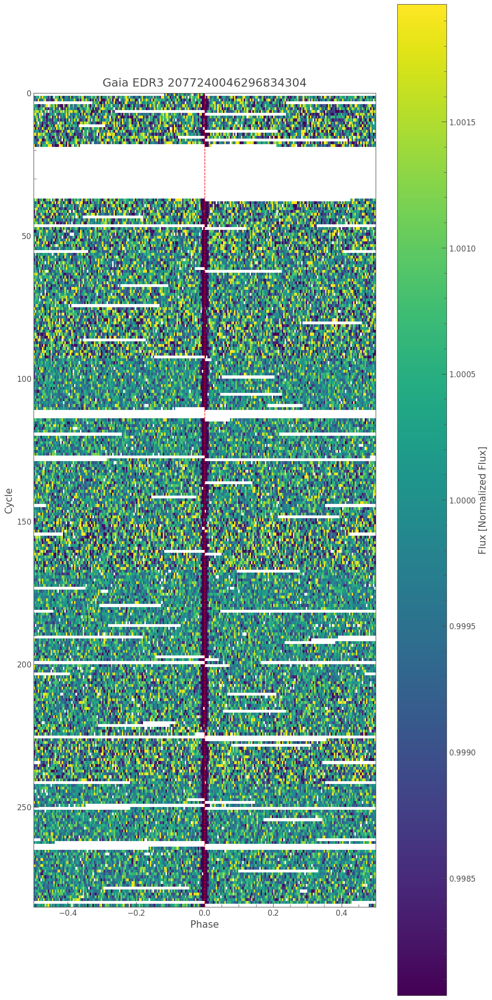

In [30]:
ax = slc.plot_river(periodogram_long.period_at_max_power, periodogram_long.transit_time_at_max_power)
ax.axvline(0, c="r", ls="--", lw=1)

In [31]:
np.linspace(0.07, 0.13, 21)

array([0.07 , 0.073, 0.076, 0.079, 0.082, 0.085, 0.088, 0.091, 0.094,
       0.097, 0.1  , 0.103, 0.106, 0.109, 0.112, 0.115, 0.118, 0.121,
       0.124, 0.127, 0.13 ])

In [32]:
pmin = 4.95
pmax = 5.05
duration = np.linspace(0.07, 0.13, 51)
period = 1 / np.linspace(1/pmin, 1/pmax, 50000)

# Periods per quarter

In [26]:
from astropy.timeseries import BoxLeastSquares

In [30]:
def _bootstrap_max(t, y, dy, random_seed=45, n_bootstrap=1000, plot=False):
    """Generate a sequence of bootstrap estimates of the max"""

    rng = np.random.RandomState(random_seed)
    period_arr = []
    duration_arr = []
    t0_arr = []
    for _ in tqdm(range(n_bootstrap)):
        s = rng.randint(0, len(y), int(len(y) * 1))  # sample with replacement
        bls_boot = BoxLeastSquares(t[s], y[s], dy[s])
        results = bls_boot.power(1 / np.linspace(1/pmin, 1/pmax, 10000),
                                 np.linspace(0.07, 0.13, 21))
        period_arr.append(results.period[np.argmax(results.power)])
        duration_arr.append(results.duration[np.argmax(results.power)])
        t0_arr.append(results.transit_time[np.argmax(results.power)])

    period_arr = np.array(period_arr)
    duration_arr = np.array(duration_arr)
    t0_arr = np.array(t0_arr)
    
    if plot:
        plt.hist(period_arr, bins=20)
        plt.xlabel("Period [d]")
        plt.show()

    return period_arr, duration_arr, t0_arr

  0%|          | 0/500 [00:00<?, ?it/s]

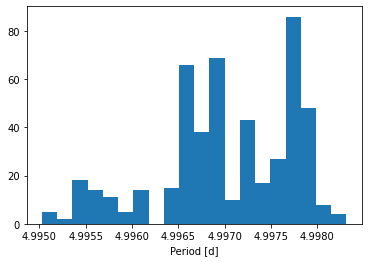

Quarter     :  2
period      :  4.997709784550865 d
period err  :  0.000720956182411306
duration    :  0.09100000000000001 d
depth       :  0.003588946084215409
transit_time:  170.34282077736918


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


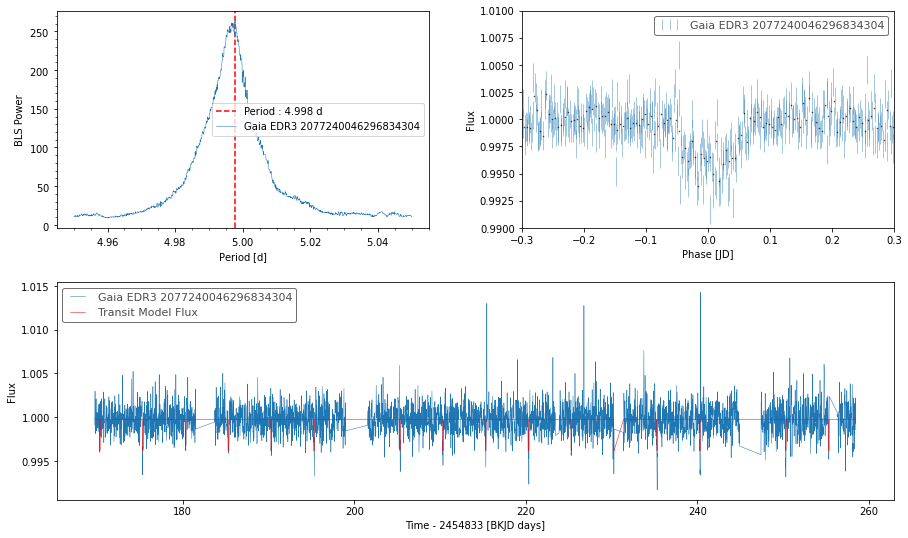

  0%|          | 0/500 [00:00<?, ?it/s]

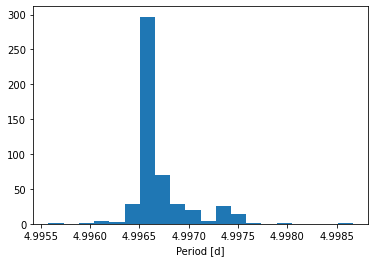

Quarter     :  4
period      :  4.996546981673465 d
period err  :  0.0002886429728193173
duration    :  0.09100000000000001 d
depth       :  0.004686729591086907
transit_time:  355.2362866606213


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


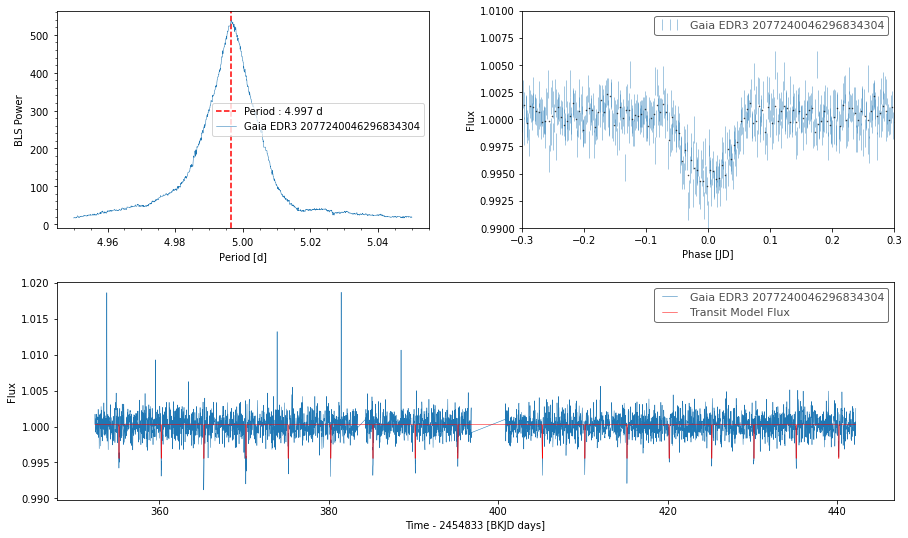

  0%|          | 0/500 [00:00<?, ?it/s]

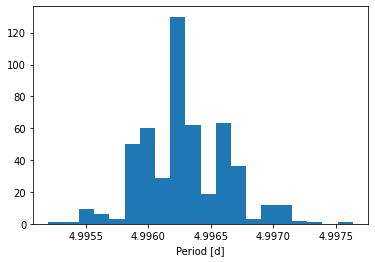

Quarter     :  5
period      :  4.995909867366658 d
period err  :  0.0003450945818462101
duration    :  0.09800000000000002 d
depth       :  0.004618265756882701
transit_time:  445.18387173641946


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


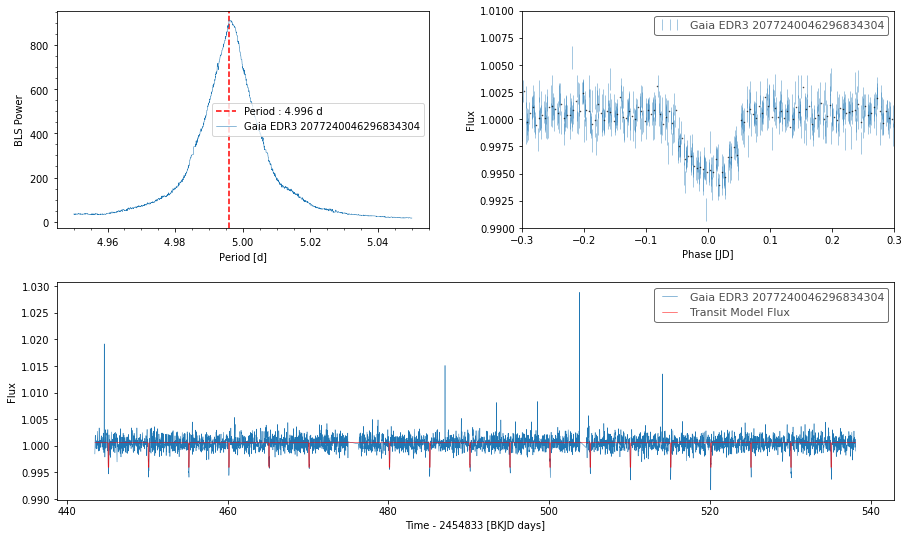

  0%|          | 0/500 [00:00<?, ?it/s]

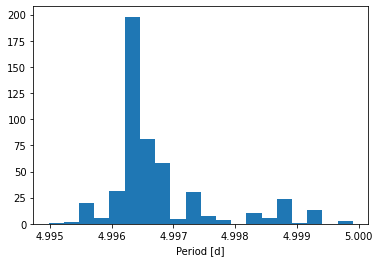

Quarter     :  6
period      :  4.996281331193069 d
period err  :  0.0008646223251682668
duration    :  0.09100000000000001 d
depth       :  0.003949075594597353
transit_time:  540.1178870214799


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


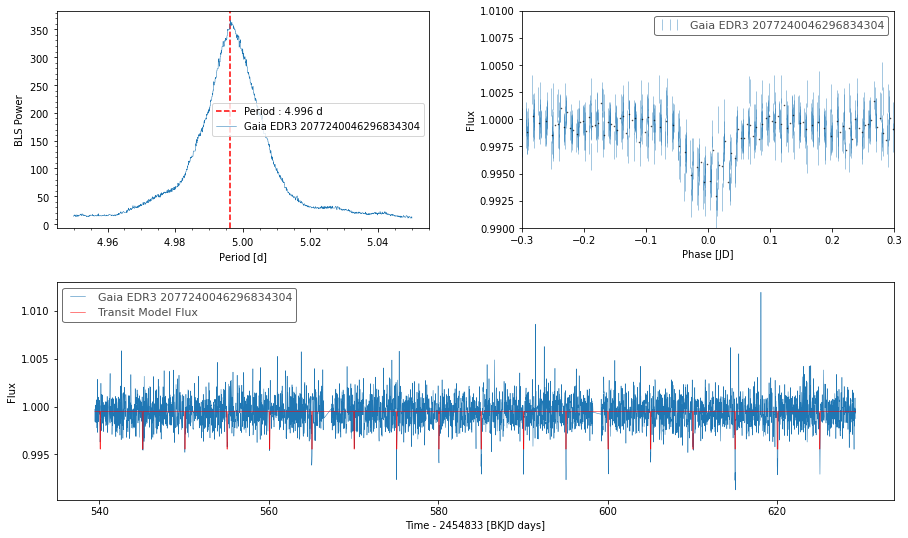

  0%|          | 0/500 [00:00<?, ?it/s]

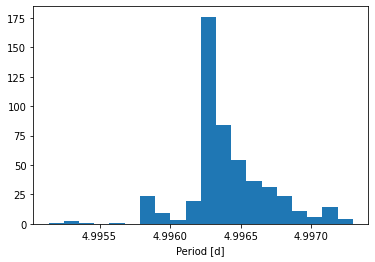

Quarter     :  7
period      :  4.996315284943075 d
period err  :  0.00029603506110882443
duration    :  0.09100000000000001 d
depth       :  0.005029321422742191
transit_time:  635.0580021205827


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


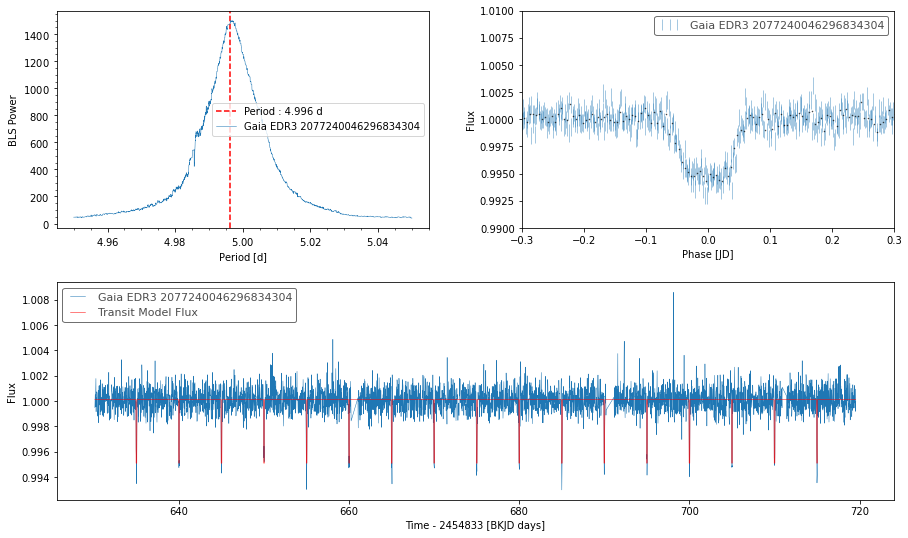

  0%|          | 0/500 [00:00<?, ?it/s]

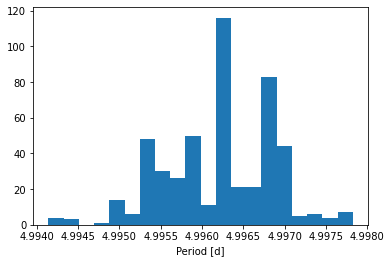

Quarter     :  8
period      :  4.996826644278197 d
period err  :  0.0006597561412295487
duration    :  0.09100000000000001 d
depth       :  0.005490110187687734
transit_time:  739.9868519869327


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


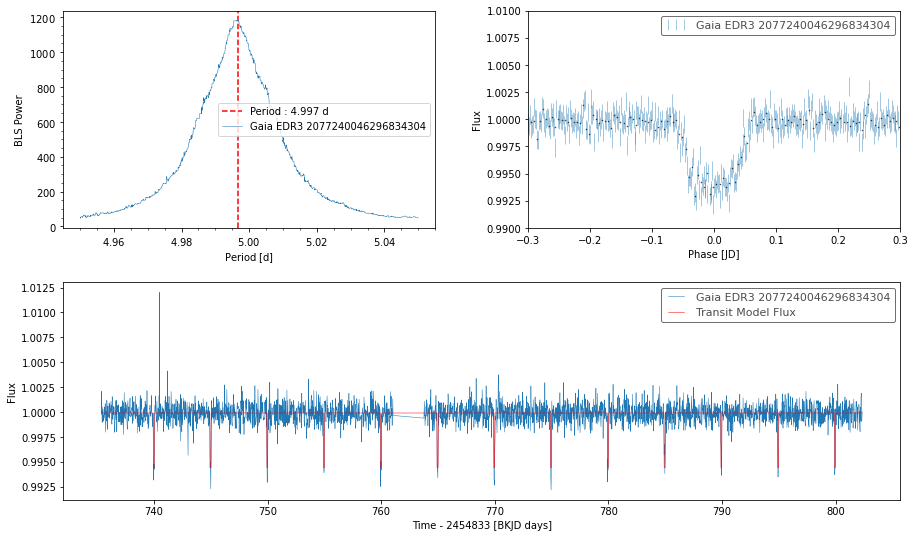

  0%|          | 0/500 [00:00<?, ?it/s]

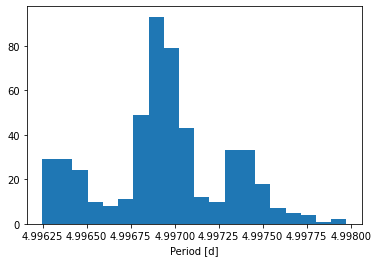

Quarter     :  9
period      :  4.996954500467471 d
period err  :  0.00035591696569997307
duration    :  0.09100000000000001 d
depth       :  0.004540134726124373
transit_time:  809.932988089477


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


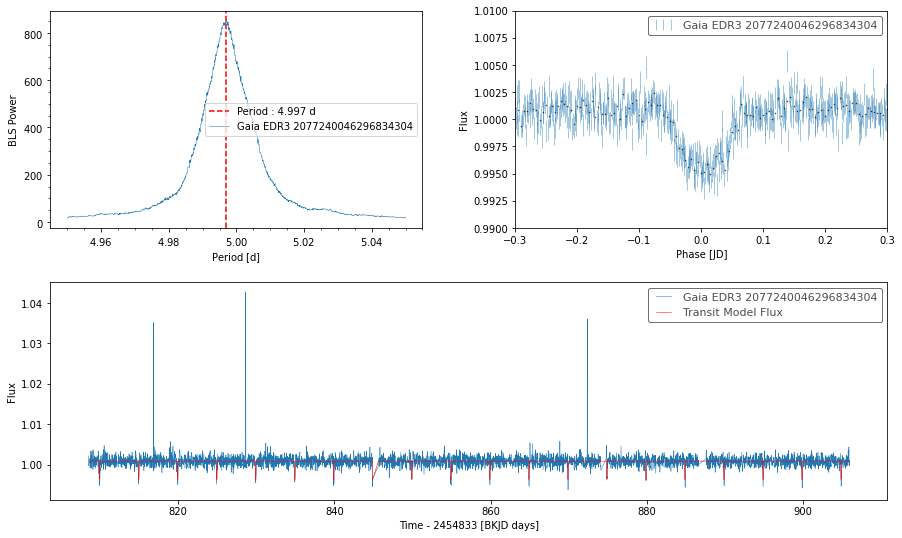

  0%|          | 0/500 [00:00<?, ?it/s]

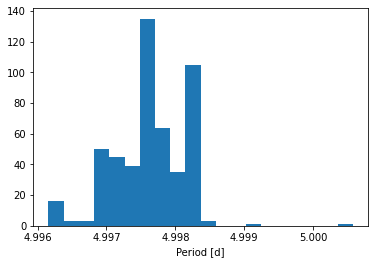

Quarter     :  10
period      :  4.997519942997444 d
period err  :  0.0005158317404956773
duration    :  0.09100000000000001 d
depth       :  0.0037716536936064564
transit_time:  909.8594090830948


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


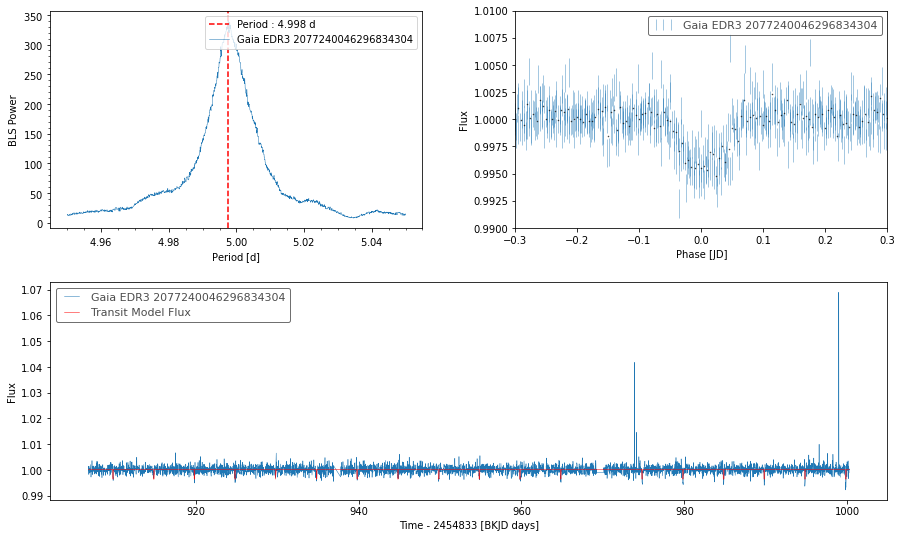

  0%|          | 0/500 [00:00<?, ?it/s]

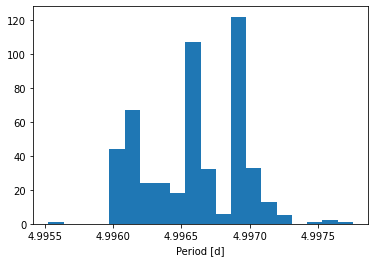

Quarter     :  11
period      :  4.996594921611007 d
period err  :  0.00034905677125469784
duration    :  0.09100000000000001 d
depth       :  0.0051022681060499345
transit_time:  1004.8103175327226


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


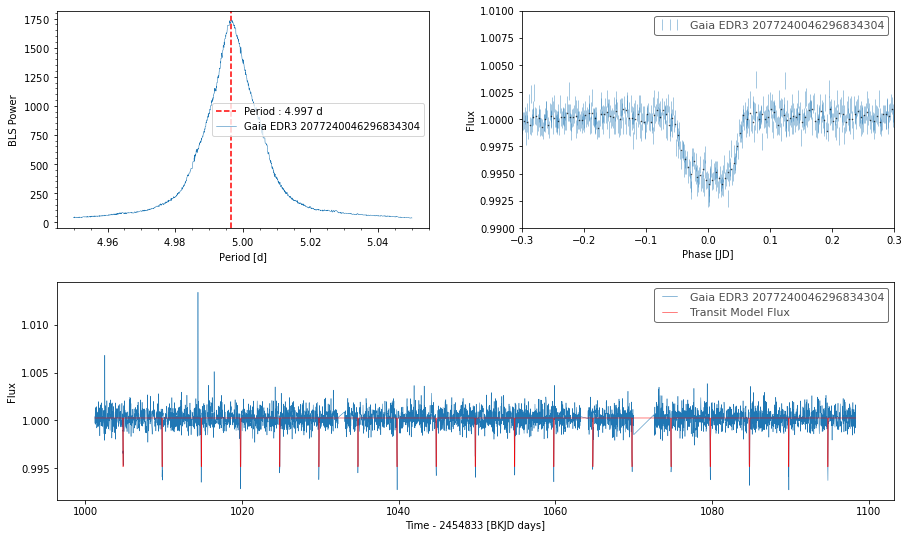

  0%|          | 0/500 [00:00<?, ?it/s]

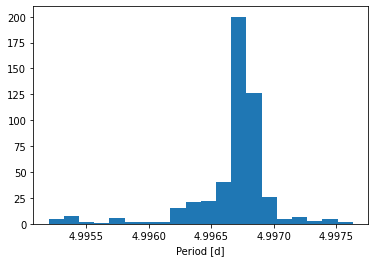

Quarter     :  12
period      :  4.996736749312617 d
period err  :  0.0003342236791400259
duration    :  0.09100000000000001 d
depth       :  0.005229132472655761
transit_time:  1099.748096246598


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


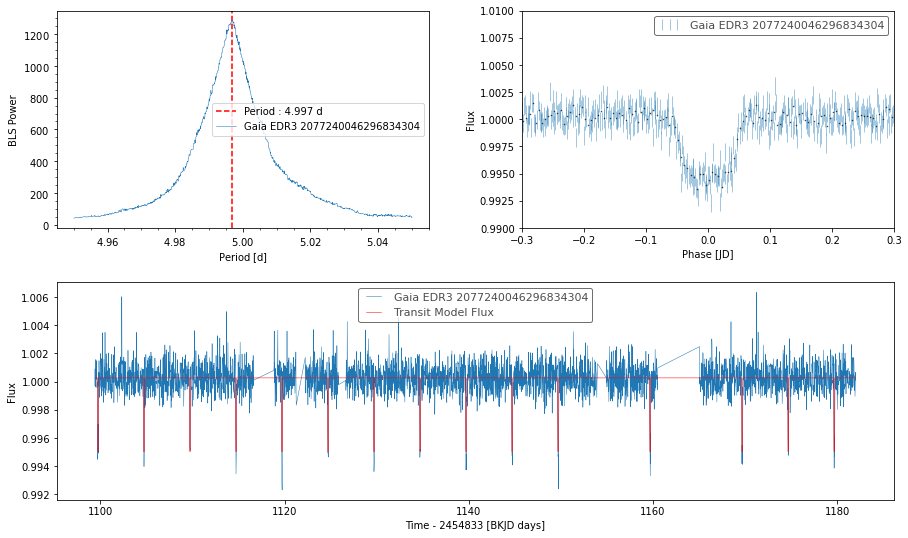

  0%|          | 0/500 [00:00<?, ?it/s]

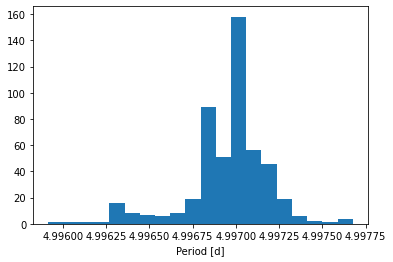

Quarter     :  13
period      :  4.996814658095902 d
period err  :  0.0002333346290774165
duration    :  0.09800000000000002 d
depth       :  0.00450043426271552
transit_time:  1184.6894595113467


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


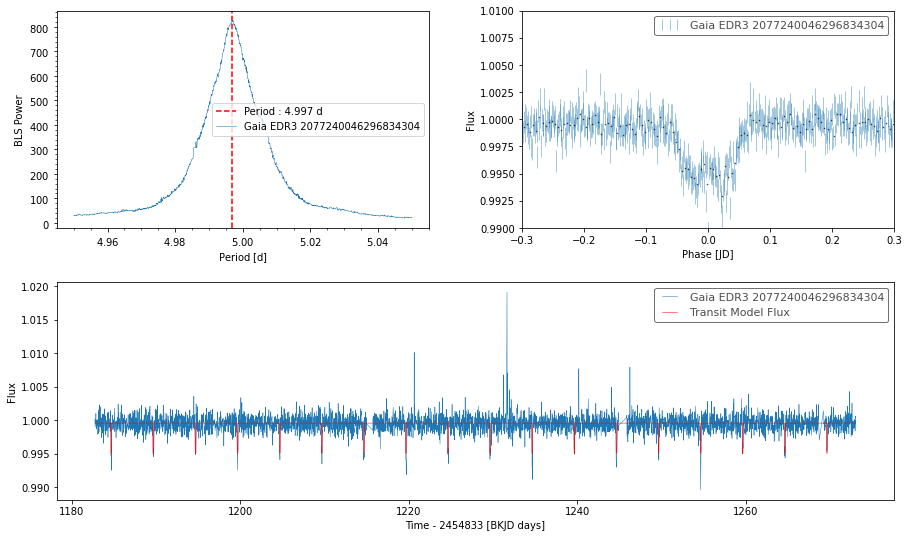

  0%|          | 0/500 [00:00<?, ?it/s]

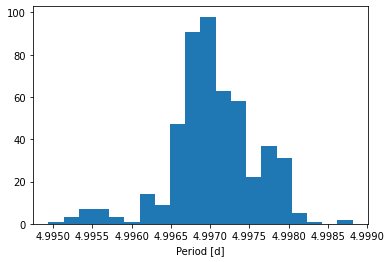

Quarter     :  14
period      :  4.9968685963690795 d
period err  :  0.0005507921833034279
duration    :  0.10500000000000001 d
depth       :  0.003286956332799003
transit_time:  1274.6331591346202


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


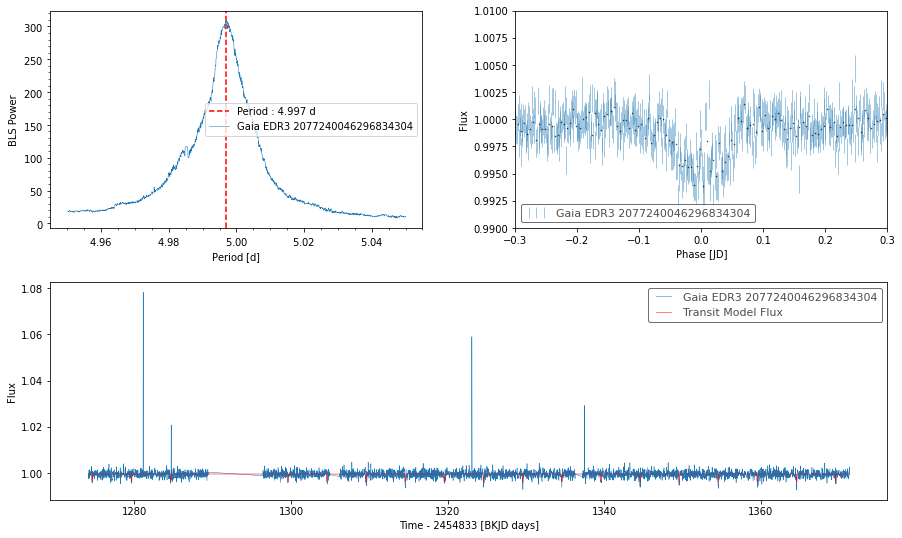

  0%|          | 0/500 [00:00<?, ?it/s]

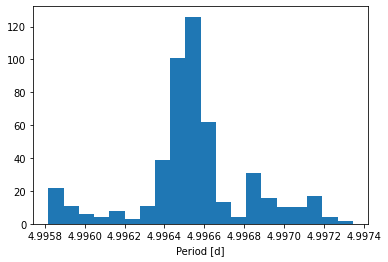

Quarter     :  15
period      :  4.996556969084591 d
period err  :  0.00028684609367138407
duration    :  0.09100000000000001 d
depth       :  0.004885465241724621
transit_time:  1374.5700491465975


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


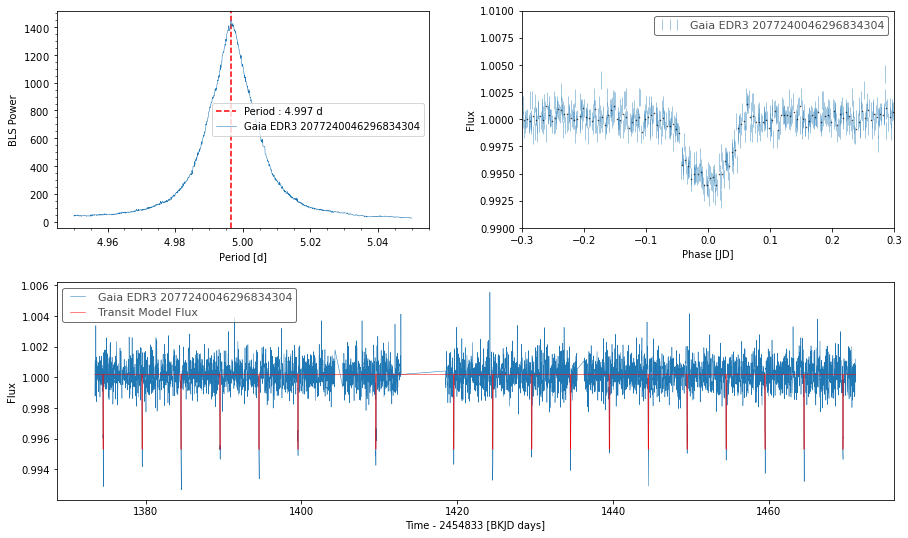

  0%|          | 0/500 [00:00<?, ?it/s]

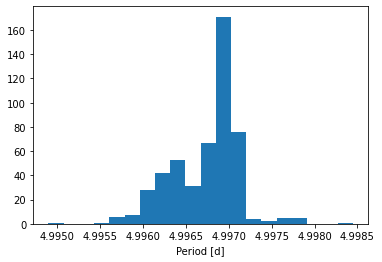

Quarter     :  16
period      :  4.996950504862516 d
period err  :  0.0003991465695151878
duration    :  0.10500000000000001 d
depth       :  0.004696677915112002
transit_time:  1474.5009163674658


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


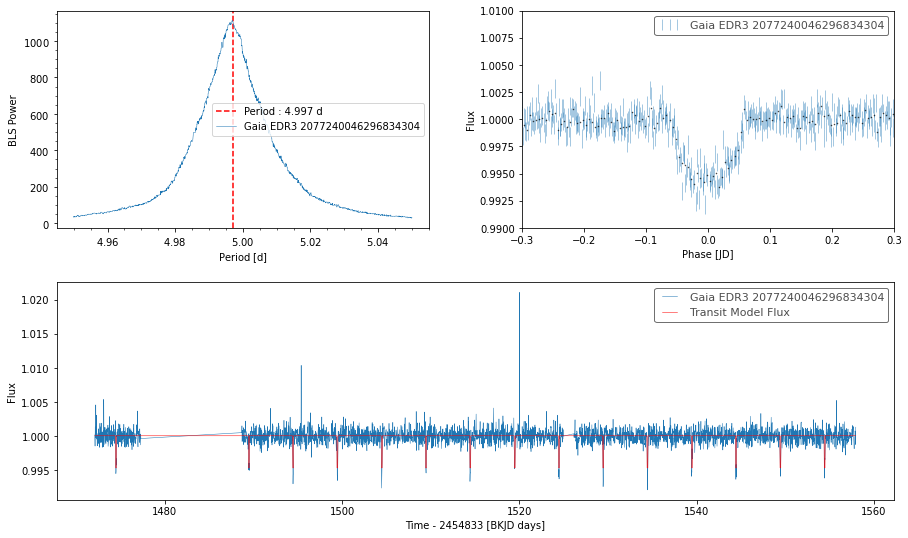

  0%|          | 0/500 [00:00<?, ?it/s]

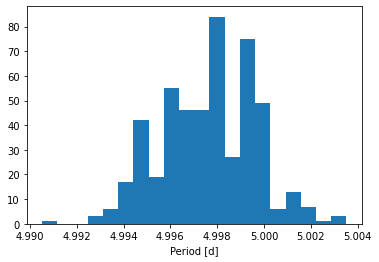

Quarter     :  17
period      :  4.99960699372954 d
period err  :  0.0020138658025413195
duration    :  0.09100000000000001 d
depth       :  0.0045455102093444315
transit_time:  1559.4391263898963


No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


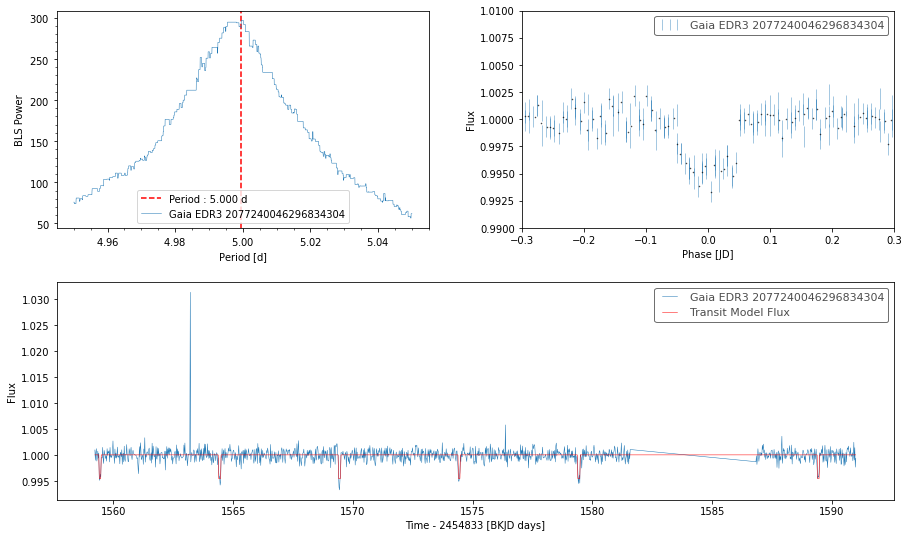

In [31]:
flcs = []
bls_results = []
t0s = {}
durations = {}
depths = {}

do_fap = True

bootsrap_res = []

for lc in regcorr_full_llc:
    periodogram = lc.to_periodogram(method="bls", period=period, duration=duration)
    
    if do_fap:
        period_arr, duration_arr, t0_arr = _bootstrap_max(lc.time.value, 
                                    lc.flux.value,
                                    lc.flux_err.value,
                                    n_bootstrap=500,
                                    plot=True
                                   )
    else:
        period_arr = np.ones(500) * periodogram.period_at_max_power.value
        duration_arr = np.ones(500) * periodogram.duration_at_max_power.value
        t0_arr = np.ones(500) * periodogram.transit_time_at_max_power.value
        
    bootsrap_res.append([period_arr, duration_arr, t0_arr])
    
    print("Quarter     : ", lc.quarter)
    print("period      : ", periodogram.period_at_max_power)
    print("period err  : ", np.std(period_arr))
    print("duration    : ", periodogram.duration_at_max_power)
    print("depth       : ", periodogram.depth_at_max_power)
    print("transit_time: ", periodogram.transit_time_at_max_power)
    
    bls_results.append([periodogram.period_at_max_power.value,
                        periodogram.duration_at_max_power.value,
                        periodogram.depth_at_max_power.value,
                        periodogram.transit_time_at_max_power.value])
    
    t0s[lc.quarter] = periodogram.transit_time_at_max_power.value
    durations[lc.quarter] = periodogram.duration_at_max_power.value
    depths[lc.quarter] = periodogram.depth_at_max_power.value
    
    plt.close()
    fig = plt.figure(figsize=(15, 9))

    plt.subplots_adjust(wspace=0.25, hspace=0.25)

    sub1 = fig.add_subplot(2, 2, 1)
    sub1.axvline(
        periodogram.period_at_max_power.value,
        color="r",
        linestyle="--",
        label="Period : %.3f d"
        % (periodogram.period_at_max_power.value),
    )
    periodogram.plot(ax=sub1)
    sub1.legend()

    sub2 = fig.add_subplot(2, 2, 2)
    flc = lc.fold(
        period=periodogram.period_at_max_power,
        epoch_time=periodogram.transit_time_at_max_power,
    )
    flc.errorbar(ax=sub2, alpha=0.8)
    flc.bin(bins=1000, aggregate_func=np.nanmedian).plot(ax=sub2, alpha=0.8, lw=0, c='k', marker=".", ms=1)
    sub2.set_xlim(-0.3, 0.3)
    sub2.set_ylim(0.990, 1.01)

    sub3 = fig.add_subplot(2, 2, (3, 4))
    lc.plot(ax=sub3)
    periodogram.get_transit_model().plot(ax=sub3, color="r")
    plt.show()
    
    flcs.append(flc)
    # break
    
bls_results = np.array(bls_results)

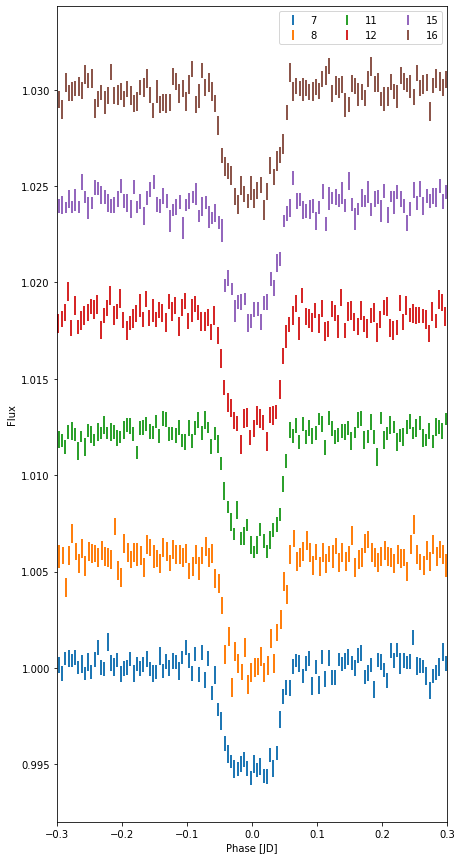

In [32]:
fig, ax = plt.subplots(1, 1, figsize=(7,15))
offset = 0
for flc in flcs:
    if flc.quarter in g304_tpfs.keys():
        lw = 2
        flc.bin(bins=1000, aggregate_func=np.nanmedian).errorbar(ax=ax, label=flc.quarter, 
                                                                 offset=offset, elinewidth=lw, ms=lw)
        offset += 0.006
    else:
        lw = 1.1
        # flc.bin(bins=1000, aggregate_func=np.nanmedian).errorbar(ax=ax, label=flc.quarter, 
        # offset=offset, elinewidth=lw, ms=lw)
        # offset += 0.006
ax.set_xlim(-0.3, 0.3)
ax.legend(ncol=3)
# ax.set_ylim(0.990, 1.004)
plt.show()

In [33]:
per_telc = []
for q, p in zip(k804_ctm_lc.keys(), bls_results[:, 0]):
    if q in g304_tpfs.keys():
        per_telc.append(p)

In [34]:
bootstrap_df = []
for i, q in enumerate(list(k804_ctm_lc.keys())):
    aux_df = pd.DataFrame(np.array(bootsrap_res[i]).T, columns=["period","duration","t0"])
    aux_df["quarter"] = q
    bootstrap_df.append(aux_df)
bootstrap_df = pd.concat(bootstrap_df)
period_err = np.array([np.std(vals[0]) for vals in bootsrap_res])

In [35]:
bootstrap_df

,period,duration,t0,quarter
0,4.996627,0.098,170.352755,2
1,4.997666,0.091,170.342821,2
2,4.995059,0.098,170.367321,2
3,4.996457,0.098,170.353321,2
4,4.996906,0.091,170.349821,2
...,...,...,...,...
495,4.999615,0.077,1559.446126,17
496,4.997136,0.098,1559.441495,17
497,5.000925,0.084,1559.440929,17
498,4.998765,0.098,1559.435626,17


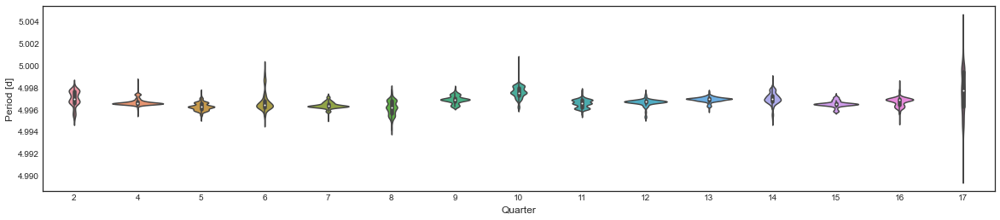

In [38]:
with plt.style.context('seaborn-white'):
    fig, ax = plt.subplots(1,1, figsize=(20,4))
    sns.violinplot(x="quarter", y="period",
                        data=bootstrap_df, ax=ax)
    # ax.axhline(periodogram_long.period_at_max_power.value, c="tab:red", ls="--", label="Period from all quarters")
    ax.set_ylabel("Period [d]", fontsize=12)
    ax.set_xlabel("Quarter", fontsize=12)
    plt.savefig("../data/figures/paper/g304_ttv_violin.pdf", 
            format="pdf", bbox_inches="tight")
    plt.show()
    

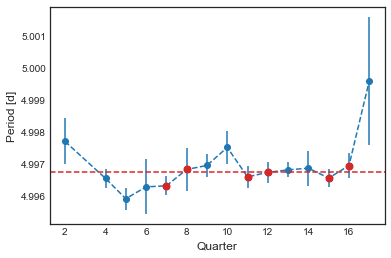

In [39]:
with plt.style.context('seaborn-white'):
    plt.errorbar(list(k804_ctm_lc.keys()), bls_results[:, 0], yerr=period_err, 
                 marker="o", ls="--", zorder=-1000)
    plt.plot(sorted(g304_tpfs.keys()), per_telc, marker="o", ls="", c="tab:red", ms=7)
    
    plt.axhline(periodogram_long.period_at_max_power.value, 
                c="tab:red", ls="--", label="Period from long LC")
    plt.ylabel("Period [d]", fontsize=12)
    plt.xlabel("Quarter", fontsize=12)
    plt.savefig("../data/figures/paper/g304_ttv.pdf", 
            format="pdf", bbox_inches="tight")
    plt.show()

In [34]:
regcorr_full_llc = lk.LightCurveCollection([lc for lc in regcorr_full_llc])
regcorr_nosp_llc = lk.LightCurveCollection([lc for lc in regcorr_nosp_llc])
# cbvcorr_llc = lk.LightCurveCollection([lc for lc in cbvcorr_llc])
combined_lcc

LightCurveCollection of 15 objects:
    0: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=2 CAMPAIGN=None>
    1: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=4 CAMPAIGN=None>
    2: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=5 CAMPAIGN=None>
    3: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=6 CAMPAIGN=None>
    4: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=7 CAMPAIGN=None>
    5: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=8 CAMPAIGN=None>
    6: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=9 CAMPAIGN=None>
    7: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=10 CAMPAIGN=None>
    8: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=11 CAMPAIGN=None>
    9: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=12 CAMPAIGN=None>
    10: <KeplerLightCurve LABEL="Gaia EDR3 2077240046296834304" QUARTER=13 CAMPAI

In [389]:
to_save = {"raw_lkc": combined_lcc,
           "CBV_corrected_lkc": cbvcorr_llc,
           "RC_full_lkc": regcorr_full_llc,
           "RC_nospline_lkc": regcorr_nosp_llc,
           "period": periodogram_long.period_at_max_power,
           "duration": periodogram_long.duration_at_max_power,
           "depth": periodogram_long.depth_at_max_power,
           "transit_time": periodogram_long.transit_time_at_max_power}

file_name = "../data/export/G304_lightcurves.pkl"
with open(file_name, "wb") as f:
            pickle.dump(to_save, f)

# Vetting centroids

# Test for TTV

In [45]:
half = int(len(slc)/2)
print(half)
slc_l = slc_tpf_exba[:half]
slc_r = slc_tpf_exba[half:]

periodogram_left = slc_l.to_periodogram(method="bls", period=period, duration=duration, frequency_factor=1000)
periodogram_right = slc_r.to_periodogram(method="bls", period=period, duration=duration, frequency_factor=1000)

29420


NameError: name 'slc_tpf_exba' is not defined

In [517]:
fslc_l = slc_l.fold(
    period=periodogram_left.period_at_max_power,
    epoch_time=periodogram_left.transit_time_at_max_power,
)

fslc_r = slc_r.fold(
    period=periodogram_right.period_at_max_power,
    epoch_time=periodogram_right.transit_time_at_max_power,
)

In [525]:
bfslc_l = fslc_l.bin(bins=2000, aggregate_func=np.nanmedian)
bfslc_r = fslc_r.bin(bins=2000, aggregate_func=np.nanmedian)

(-0.2, 0.2)

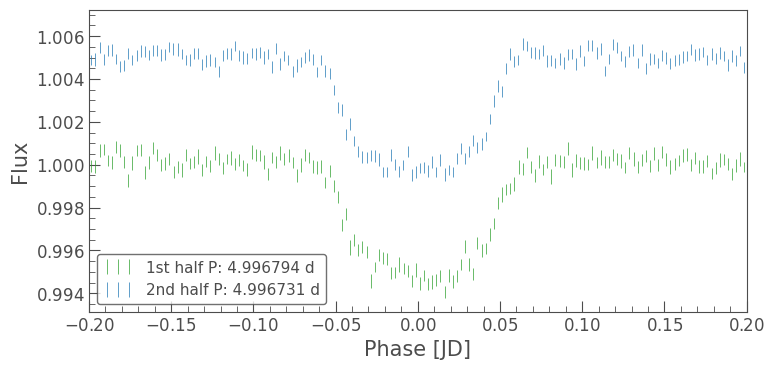

In [536]:
ax = bfslc_l.errorbar(c="tab:green", label="1st half P: %.6f d" % (periodogram_left.period_at_max_power.value))
bfslc_r.errorbar(c="tab:blue", ax=ax, label="2nd half P: %.6f d" % (periodogram_right.period_at_max_power.value), offset=0.005)
ax.set_xlim(-.2, 0.2)

In [532]:
(periodogram_left.period_at_max_power - periodogram_right.period_at_max_power).to("second")

<Quantity 5.48174183 s>

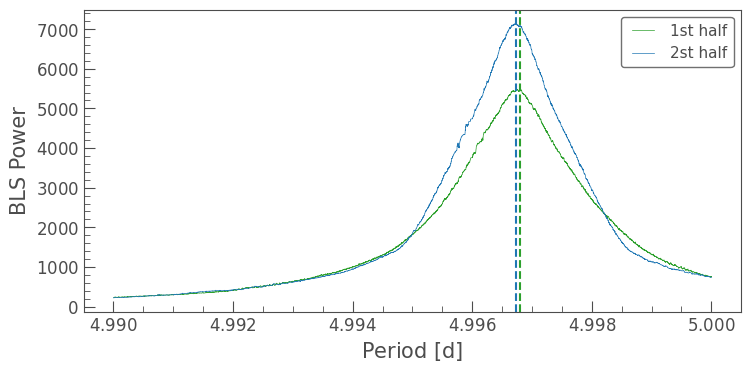

In [529]:
ax = periodogram_left.plot(label="1st half", c="tab:green")
periodogram_right.plot(ax=ax, label="2st half", c="tab:blue")
ax.axvline(periodogram_left.period_at_max_power.value, c="tab:green", ls="--")
ax.axvline(periodogram_right.period_at_max_power.value, c="tab:blue", ls="--")

# Only EXBA + TPF

In [76]:
g304_tpfs.keys()

dict_keys([11, 12, 15, 16, 7, 8])

<AxesSubplot:xlabel='Time - 2454833 [BKJD days]', ylabel='Normalized Flux'>

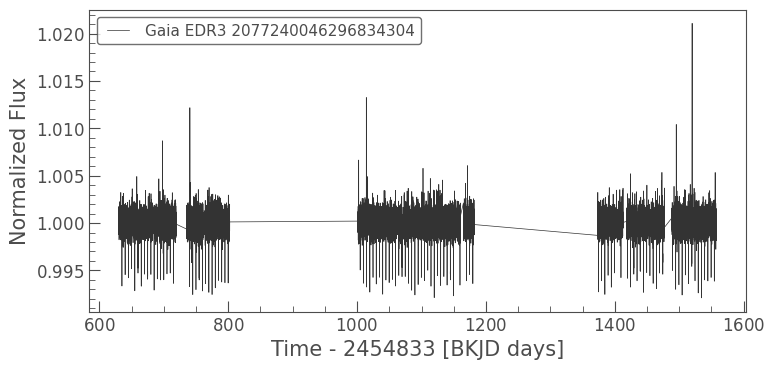

In [77]:
regcorr_full_etlc = lk.LightCurveCollection([lc for lc in [k for k in regcorr_full_llc] if lc.quarter in g304_tpfs.keys()])
regcorr_full_etlc = regcorr_full_etlc.stitch()
regcorr_full_etlc.plot()

In [78]:
periodogram_etlc = regcorr_full_etlc.to_periodogram(method="bls", period=period, duration=duration, frequency_factor=1000)

In [79]:
f_regcorr_full_etlc = regcorr_full_etlc.fold(
    period=periodogram_long.period_at_max_power,
    epoch_time=periodogram_long.transit_time_at_max_power,
)
f_regcorr_full_etlc_bin = f_regcorr_full_etlc.bin(bins=2000, aggregate_func=np.nanmedian)

(-0.2, 0.2)

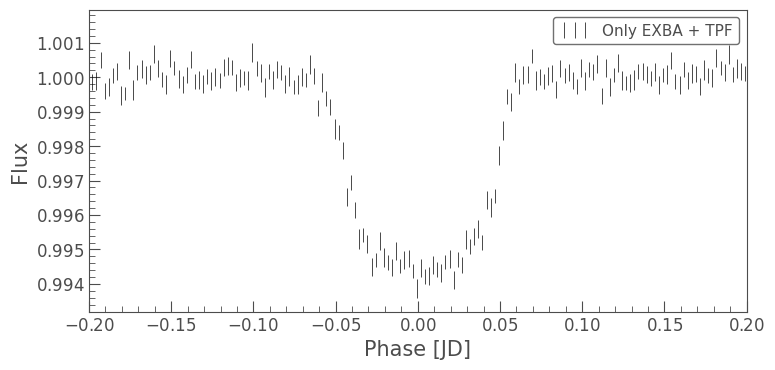

In [80]:
ax = f_regcorr_full_etlc_bin.errorbar(c="k", label="Only EXBA + TPF")
ax.set_xlim(-.2, 0.2)

In [81]:
print("period      : ", periodogram_etlc.period_at_max_power)
print("duration    : ", periodogram_etlc.duration_at_max_power)
print("depth       : ", periodogram_etlc.depth_at_max_power)
print("transit_time: ", periodogram_etlc.transit_time_at_max_power.bkjd)

period      :  4.9966755756524215 d
duration    :  0.09100000000000001 d
depth       :  0.005067507264577739
transit_time:  635.0580021205827


In [82]:
bls_stats_etlc = periodogram_etlc.compute_stats()

No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


In [83]:
bls_stats_etlc["depth_odd"], bls_stats_etlc["depth_even"]

((<Quantity 0.00503112>, <Quantity 5.58177718e-05>),
 (<Quantity 0.00510569>, <Quantity 5.71695081e-05>))

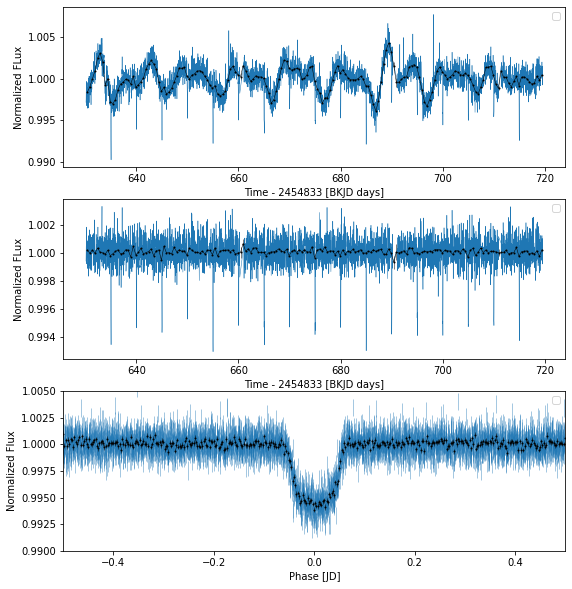

In [85]:
if True:
    fig, ax = plt.subplots(3,1, figsize=(9,10))
    
    regcorr_nosp_llc[4].plot(color="tab:blue", ax=ax[0], rasterized=True)
    regcorr_nosp_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).errorbar(
        ax=ax[0], alpha=1, lw=0.5, c='k', marker=".", ms=2)
    regcorr_nosp_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).plot(
        ax=ax[0], alpha=1, lw=0.5, c='k')
    ax[0].set_ylabel("Normalized FLux")
    ax[0].legend("")
    
    regcorr_full_llc[4].remove_outliers(sigma_lower=1e10, sigma_upper=3).plot(color="tab:blue", ax=ax[1], rasterized=True)
    regcorr_full_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).errorbar(
        ax=ax[1], alpha=1, lw=0.5, c='k', marker=".", ms=2)
    regcorr_full_llc[4].bin(time_bin_size=0.5, aggregate_func=np.nanmedian).plot(
        ax=ax[1], alpha=1, lw=0.5, c='k')
    ax[1].set_ylabel("Normalized FLux")
    ax[1].legend("")
    
    f_regcorr_full_etlc.errorbar(alpha=0.8, c="tab:blue", ax=ax[2], rasterized=True)
    f_regcorr_full_etlc.bin(bins=2000, aggregate_func=np.nanmedian).errorbar(
        ax=ax[2], alpha=1, lw=0.5, c='k', marker=".", ms=2)
    ax[2].set_xlim(-0.5, 0.5)
    ax[2].set_ylim(0.99, 1.005)
    ax[2].set_ylabel("Normalized Flux")
    ax[2].legend("")
    # plt.savefig("../data/figures/paper/g304_lc.pdf", 
    #             format="pdf", bbox_inches="tight")
    plt.show()

In [88]:
flatten_test = regcorr_full_etlc.flatten()
flat_bls = flatten_test.to_periodogram(method="bls", period=period, duration=duration, frequency_factor=1000)

In [90]:
bls_stats = flat_bls.compute_stats()

No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


In [108]:
print("Odd : ", bls_stats["depth_odd"])
print("Even: ", bls_stats["depth_even"])

Odd :  (<Quantity 0.00503922>, <Quantity 5.58157271e-05>)
Even:  (<Quantity 0.00509802>, <Quantity 5.71683118e-05>)


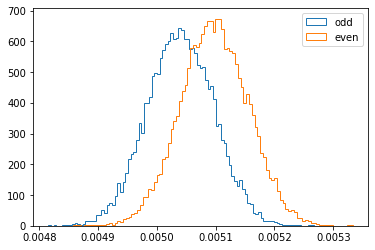

In [106]:
plt.hist(np.random.normal(bls_stats["depth_odd"][0].value, bls_stats["depth_odd"][1].value, 20000), bins=100, histtype="step", label="odd")
plt.hist(np.random.normal(bls_stats["depth_even"][0].value, bls_stats["depth_even"][1].value, 20000), bins=100, histtype="step", label="even")
plt.legend();

### Only TPFs

<AxesSubplot:xlabel='Time - 2454833 [BKJD days]', ylabel='Normalized Flux'>

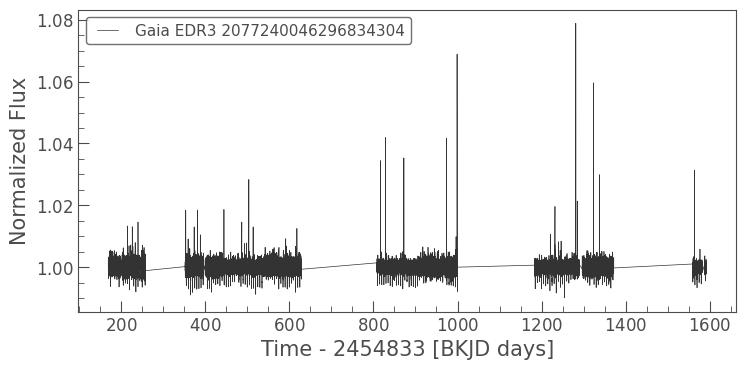

In [554]:
regcorr_full_tlc = lk.LightCurveCollection([lc for lc in [k for k in regcorr_full_llc] if not lc.quarter in g304_tpfs.keys()])
regcorr_full_tlc = regcorr_full_tlc.stitch()
regcorr_full_tlc.plot()

In [555]:
periodogram_tlc = regcorr_full_tlc.to_periodogram(method="bls", period=period, duration=duration, frequency_factor=1000)

In [590]:
f_regcorr_full_tlc = regcorr_full_tlc.fold(
    period=periodogram_long.period_at_max_power,
    epoch_time=periodogram_long.transit_time_at_max_power,
)
f_regcorr_full_tlc = f_regcorr_full_tlc.bin(bins=2000, aggregate_func=np.nanmedian)

(-0.2, 0.2)

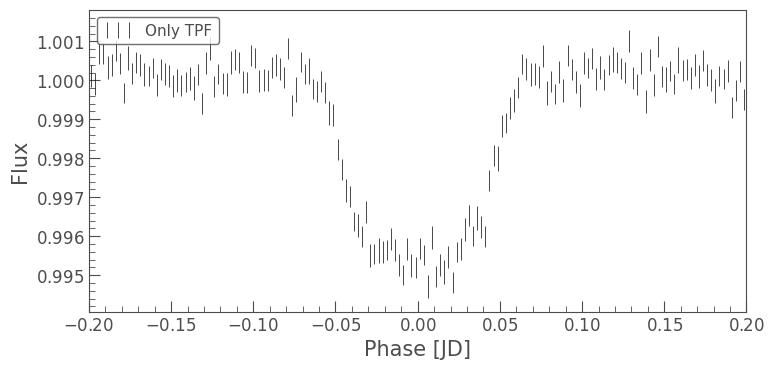

In [591]:
ax = f_regcorr_full_tlc.errorbar(c="k", label="Only TPF")
ax.set_xlim(-.2, 0.2)

In [640]:
print("period      : ", periodogram_tlc.period_at_max_power)
print("duration    : ", periodogram_tlc.duration_at_max_power)
print("depth       : ", periodogram_tlc.depth_at_max_power)
print("transit_time: ", periodogram_tlc.transit_time_at_max_power.jd)

period      :  4.996738736634959 d
duration    :  0.09800000000000002 d
depth       :  0.004113203997268576
transit_time:  2455003.3533207774


In [562]:
(periodogram_etlc.period_at_max_power - periodogram_tlc.period_at_max_power).to("second")

<Quantity -5.39515996 s>

(-0.2, 0.2)

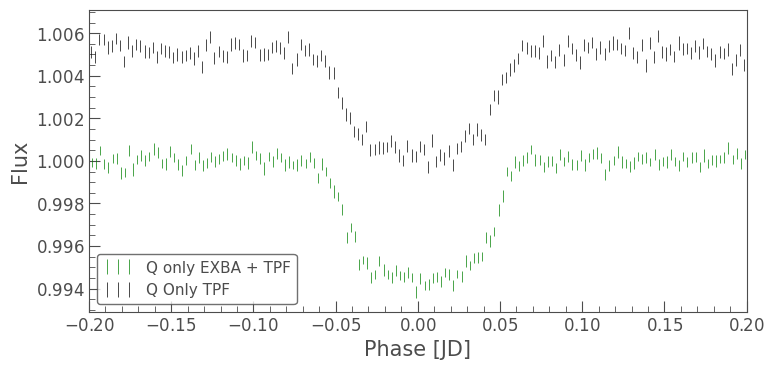

In [595]:
ax = f_regcorr_full_etlc.errorbar(c="g", label="Q only EXBA + TPF")
f_regcorr_full_tlc.errorbar(c="k", label="Q Only TPF", ax=ax, offset=0.005)
ax.set_xlim(-.2, 0.2)

In [639]:
lk.LightCurve(regcorr_full_etlc).to_fits("../data/export/G304_onlyTPFnEXBA_corrected_full.fits")

[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x12af19220>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x1310c9c10>]

In [645]:
regcorr_full_etlc.flux.unit

Unit(dimensionless)

In [648]:
test = regcorr_full_etlc.copy()

In [650]:
test.flux = test.flux.value * combined_lcc[0].flux.unit

In [651]:
test.flux

<Quantity [0.99940283, 0.9999546 , 1.00043264, ..., 0.99876837, 0.99984868,
           1.00131742] electron / s>

# TPF + EXBA image

In [49]:
G304_tpf = lk.search_targetpixelfile("KIC 7214804",
                                      author="Kepler", 
                                      cadence="long").download_all()
print(G304_tpf)
idx = 4
print(G304_tpf[4].quarter)

TargetPixelFileCollection of 15 objects:
    0: KeplerTargetPixelFile Object (ID: 7214804)
    1: KeplerTargetPixelFile Object (ID: 7214804)
    2: KeplerTargetPixelFile Object (ID: 7214804)
    3: KeplerTargetPixelFile Object (ID: 7214804)
    4: KeplerTargetPixelFile Object (ID: 7214804)
    5: KeplerTargetPixelFile Object (ID: 7214804)
    6: KeplerTargetPixelFile Object (ID: 7214804)
    7: KeplerTargetPixelFile Object (ID: 7214804)
    8: KeplerTargetPixelFile Object (ID: 7214804)
    9: KeplerTargetPixelFile Object (ID: 7214804)
    10: KeplerTargetPixelFile Object (ID: 7214804)
    11: KeplerTargetPixelFile Object (ID: 7214804)
    12: KeplerTargetPixelFile Object (ID: 7214804)
    13: KeplerTargetPixelFile Object (ID: 7214804)
    14: KeplerTargetPixelFile Object (ID: 7214804)
7


In [50]:
G304_col, G304_row = np.mgrid[G304_tpf[idx].column : G304_tpf[idx].column + G304_tpf[idx].shape[2],
                              G304_tpf[idx].row : G304_tpf[idx].row + G304_tpf[idx].shape[1]]

In [54]:
exba = EXBAMachine(quarter=7, channel=17, magnitude_limit=20, gaia_dr=3)

TargetPixelFileCollection of 4 objects:
    0: KeplerTargetPixelFile Object (ID: 100002955)
    1: KeplerTargetPixelFile Object (ID: 100002956)
    2: KeplerTargetPixelFile Object (ID: 100002957)
    3: KeplerTargetPixelFile Object (ID: 100002958)
Loading query from file...
../data/catalogs/exba/7/channel_17_gaiadr3_xmatch.csv


In [56]:
g304 = exba.sources.query("designation == 'Gaia EDR3 2077240046296834304'")

(1    555.272134
 Name: col, dtype: float64,
 1    572.286012
 Name: row, dtype: float64)

In [90]:
G304_tpf[idx].meta["RA_OBJ"], G304_tpf[idx].meta["DEC_OBJ"]

(295.86189, 42.71145)

In [98]:
kic_col, kic_row = G304_tpf[idx].wcs.wcs_world2pix(G304_tpf[idx].meta["RA_OBJ"], G304_tpf[idx].meta["DEC_OBJ"], 0)
kic_col += G304_tpf[idx].column
kic_row += G304_tpf[idx].row

In [110]:
exba.col

array([556, 557, 558, ..., 589, 590, 591])

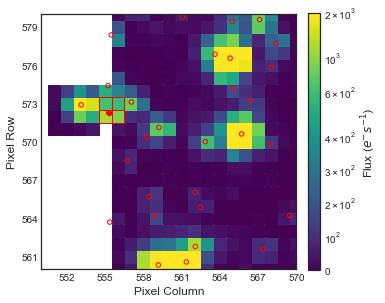

In [130]:
with plt.style.context('seaborn-white'):
    fig, ax = plt.subplots(1, figsize=(5, 7))
    # exba data
    pc = ax.scatter(exba.col_2d, exba.row_2d, c=exba.flux_2d[100].value, 
                marker="s", s=148, cmap="viridis",
                norm=colors.SymLogNorm(linthresh=500, vmin=0, vmax=2000, base=10))
    # TPF data
    ax.scatter(G304_col.T, G304_row.T, c=G304_tpf[idx].flux[0].value, 
                marker="s", s=148, cmap="viridis",
                norm=colors.SymLogNorm(linthresh=500, vmin=0, vmax=2000, base=10))
    
    cbar = fig.colorbar(pc, fraction=0.046, pad=0.04)
    cbar.set_label(label=r"Flux ($e^{-}s^{-1}$)", size=12)

    # EXBA gaia sources
    ax.scatter(
                    exba.sources.col,
                    exba.sources.row,
                    s=20,
                    facecolors="none",
                    marker="o",
                    edgecolors="r",
                    linewidth=1.,
                    label="Gaia Sources",
                )

    # G304
    ax.scatter(
                    g304.col,
                    g304.row,
                    s=20,
                    facecolors="r",
                    marker="o",
                    edgecolors="r",
                    linewidth=1.,
                    label="Gaia Sources",
                )
    # TPF targer
    ax.scatter(
                    kic_col,
                    kic_row,
                    s=20,
                    facecolors="none",
                    marker="o",
                    edgecolors="r",
                    linewidth=1.,
                    label="Gaia Sources",
                )
    # contaminante aperture from TPF
    for i in range(k804_ctm_ap[7].shape[0]):
        for j in range(k804_ctm_ap[7].shape[1]):
            if k804_ctm_ap[7][i, j]:
                rect = patches.Rectangle(
                    xy=(j + G304_tpf[idx].column - 0.5, i + G304_tpf[idx].row - 0.5),
                    width=1,
                    height=1,
                    color="red",
                    fill=False,
                    hatch="",
                )
                ax.add_patch(rect)
    # contaminante aperture from EXBA
    for i in range(g304_ctm_ap[7].shape[0]):
        for j in range(g304_ctm_ap[7].shape[1]):
            if g304_ctm_ap[7][i, j]:
                rect = patches.Rectangle(
                    xy=(j + exba.col.min() - 0.5, i + exba.row.min() - 0.5),
                    width=1,
                    height=1,
                    color="red",
                    fill=False,
                    hatch="",
                )
                ax.add_patch(rect)

    ax.set_aspect("equal", adjustable="box")
    ax.set_ylim(560, 580)
    ax.set_xlim(550, 570)

    ax.set_xlabel("Pixel Column", fontsize=12)
    ax.set_ylabel("Pixel Row", fontsize=12)
    ax.xaxis.set_major_locator(plt.MaxNLocator(7))
    ax.yaxis.set_major_locator(plt.MaxNLocator(7))
    ax.set_aspect("equal", adjustable="box")
    
    plt.savefig("../data/figures/paper/g304_img.pdf", 
            format="pdf", bbox_inches="tight")
    
    plt.show()
